**NOTEBOOK FOR SPLITTING DATA OF ELECTRO L2, TRAINING AND TESTING SMP MANet MODEL ON ELECTRO L2 PATCHES**

## Import all needed packages and define all useful functions

In [1]:
import torch
import torch.nn.functional as F
import torchmetrics
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import pandas as pd
from tqdm import tqdm
from timeit import default_timer as timer 
from PIL import Image
import numpy as np
import gc
import warnings
import os
import matplotlib.pyplot as plt
from torch import nn
from IPython.display import clear_output
from torcheval.metrics.functional import multiclass_f1_score
import random
import glob
import tifffile as tff
from skimage.transform import resize as interp_resize
import segmentation_models_pytorch as smp
import torch.optim as optim
import rasterio
from ranger21 import Ranger21
import kornia as K
from kornia.augmentation.container import AugmentationSequential
from kornia.augmentation import (
    RandomAffine,
    RandomElasticTransform,
    RandomHorizontalFlip,
    RandomPerspective,
    RandomRotation,
    RandomVerticalFlip)
%matplotlib inline
warnings.filterwarnings("ignore")
torch.version.cuda,np.version.version

('11.6', '1.23.5')

### Initilize your current directory and device (CUDA recommended)

In [3]:
np.set_printoptions(threshold=1e7)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
your_current_dir = os.getcwd()
print('Your current dir of this .ipynb file',your_current_dir)
print('Your device:',device)

Your current dir of this .ipynb file C:\Users\nikita.belyakov\Documents\GitHub\CLOUD_SNOW_SEGMENTATION\training_model_utils
Your device: cuda


### Set random seeds for stability everywhere

In [5]:
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
seed_everything(seed=42)

### Define functions for preprocessing and postprocessing multispectral data as pytorch tensors

In [6]:
def batch_to_img(xb, idx=0):
    img = np.array(xb.squeeze(0))
    return np.array(img.transpose((1,2,0))*255)
def transpose_patch(patch):
    tr = np.array(patch).astype(np.uint8).transpose((2,0,1))
    return tr
def predb_to_mask(predb,idx=0):
    p = torch.functional.F.softmax(predb.squeeze(0), 0)
    return p.argmax(0).cpu()
def inverse_normalize(tensor,mean,std,num_shannels =5):
    tensor = tensor.detach().cpu().numpy()
    # unnormalize the RGB channels
    for i in range(num_shannels):
        tensor[i] = (tensor[i] * std[i]) + mean[i]
    # clip values to [0, 1] range
    tensor = np.clip(tensor, 0, 1)
    # convert back to uint8
    tensor = (tensor * 255).astype(np.uint8)
    return tensor
def inverse_normalize(tensor,num_channels =4):
    tensor = tensor.detach().cpu().numpy()
    mean = np.array([0.33852508171973034, 0.24417021384913798, 0.28669938065445844,0.28669938065445844,0,0,0])
    std = np.array([0.1279431776589227, 0.1279651689319862, 0.14410499167422117,0.14410499167422117,1,1,1])
    # unnormalize the RGB channels
    for i in range(num_channels):
        tensor[i] = (tensor[i] * std[i]) + mean[i]
    # clip values to [0, 1] range
    tensor = np.clip(tensor, 0, 1)
    return tensor
def open_sample_as_pil(datacube):
    inversed_rgb = inverse_normalize(datacube[0:4], num_channels = 4)
    rgb = np.dstack((inversed_rgb[2,:,:],inversed_rgb[1,:,:],inversed_rgb[0,:,:]))*255
    return rgb.astype('uint8')
def open_sample_as_pil_no_norm(datacube):
    inversed_rgb = (datacube[0:3])
    rgb = np.dstack((inversed_rgb[2,:,:],inversed_rgb[1,:,:],inversed_rgb[0,:,:]))*255
    return rgb.astype('uint8')
def open_DEM(datacube):
    dem_arr = datacube[5]
    return dem_arr.numpy()
def open_mask_as_pil(seglabel):
    mask = (seglabel.numpy())
    return mask

## Utils and functions for ZSA correction and splitting all data to patches for creating your own Dataset for segmentation task training

**FUNC TO DERIVE ZSA AND APPLY ZSA CORRECTION TO ONE LOCATION**

In [8]:
def ZSA_for_full_image(rgb_array, time, sat_lon):
    # Define the longitude and latitude ranges
    rgb_shape = rgb_array.shape[0]
    lon_range = np.linspace(sat_lon-79, 79+sat_lon, rgb_shape)
    lat_range = np.linspace(-81, 81.1, rgb_shape)
    out_file = r'H:/ELECTRO_L3/2022/december/01/1030/rgb_ZSA_.jpg'
    # Define the location
    latitude, longitude = np.meshgrid(lat_range, lon_range)
    latitude = np.rot90(latitude,1)
    longitude = np.rot90(longitude,1)
    # create a Location object with the specified coordinates
    location = pvlib.location.Location(latitude.flatten(), longitude.flatten())
    times = np.array([time for i in range(len(longitude.flatten()))])
    # calculate the solar position for the specified time and location
    solar_position = location.get_solarposition(times)
    # calculate the zenith angle for each pixel
    zenith_angle = solar_position['apparent_zenith'].values
    zenith_angle = np.clip(zenith_angle, 0.0, 80.0) # clip to avoid angles close to 90 and division by zero!
    zenith_angle_rad = np.deg2rad(zenith_angle)
    # Calculate the cosine of the zenith angle for all pixels
    cos_zenith_angle = np.cos(zenith_angle_rad)
    cos_zenith_angles = cos_zenith_angle.reshape(rgb_shape,rgb_shape)
    # Apply the correction to the satellite image
    corrected_sat_image = rgb_array / cos_zenith_angles[:, :, np.newaxis]
    corrected_sat_image = np.clip(corrected_sat_image, 0, 255).astype(np.uint8)
    Image.fromarray(corrected_sat_image).save(out_file)
    return corrected_sat_image
def check_lon_lat_correctness(lon, lat):
    lon, lat = lon[0,:],lat[0,:]
    is_ascending_lon  = np.all(lon[1:] > lon[:-1])
    is_ascending_lat  = np.all(lat[1:] == lat[:-1])
    return is_ascending_lon, is_ascending_lat    

### Defining functions for splitting RGB, Auxiliary geoinformation, BT channels and masks

In [9]:
patch_size = 224
def split_image(image, patch_size,dir_name):
    if image.shape[0]!=11136:
        print('res = 3 km, upsampling to 1 km res')
    image = np.array(Image.fromarray(image).resize((11136,11136))).astype(np.uint8)
    if image.shape[0]%patch_size[0]!=0:
    # Calculate the number of patches in each dimension
        image = image[80:-80,80:-80,:]
    n_patches_h = image.shape[0] // patch_size[0]
    n_patches_w = image.shape[0] // patch_size[1]
    print('n_patches_h,n_patches_w',n_patches_h,n_patches_w)
    # Check if the image can be evenly divided into patches
    assert image.shape[0] == n_patches_h * patch_size[0], f"Image height {image.shape[0]} is not divisible by patch height {patch_size[0]}"
    assert image.shape[1] == n_patches_w * patch_size[1], f"Image width {image.shape[1]} is not divisible by patch width {patch_size[1]}"
    # Split the image into non-overlapping patches
    patches = []
    for i in tqdm(range(n_patches_h)):
        for j in range(n_patches_w):
            patch = image[i * patch_size[0]:(i + 1) * patch_size[0], j * patch_size[1]:(j + 1) * patch_size[1]]
            patches.append(patch)
            result = Image.fromarray((patch).astype(np.uint8))
            patch_name= dir_name+'patch_'+str(n_patches_h*i+j)+'.jpg'
            result.save(patch_name)
    return np.array(patches)
    ############ THE SAME FUNCS FOR LONLAT ARRAYS##############################################
def split_lonlat_to_patches(matrix,patch_size, dir_name):
    if matrix.shape[0]!= 11136:
        lon, lat = matrix[:,:,0],matrix[:,:,1]
        lon = interp_resize(lon,(rgb_shape,rgb_shape))
        lat = interp_resize(lat,(rgb_shape,rgb_shape))
        matrix = np.dstack([lon,lat])
    if matrix.shape[0]%patch_size!=0:
        matrix = matrix[80:-80,80:-80,:]
    n_patches_h = matrix.shape[0] // patch_size
    n_patches_w = matrix.shape[0] // patch_size
    patches = []
    for i in tqdm(range(n_patches_h)):
        for j in range(n_patches_w):
            patch = matrix[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size]
            patches.append(patch)
            patch_name= dir_name+'patch_'+str(n_patches_h*i+j)+'.npy'
            np.save(patch_name, patch)    
    return np.array(patches)

**SPLITTING GOES STACK OF MULTISPECTRAL CHANNELS TO PATCHES AND SAVE THEM FOR DATASET**

In [9]:
def split_rgb_aux_stack(stack, patch_size,dir_name):
    print('init stack shape =', stack.shape)
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    if stack.shape[0]%patch_size!=0:
    # Calculate the number of patches in each dimension
        if stack.shape[1]==5424:
            print('############ half of img only!!!!!!!')
            stack = stack[48:-48,48:,:]
        else:
            print('############full img processing!!!!!!!')
            stack = stack[48:-48,48:-48,:]
    n_patches_h = stack.shape[0] // patch_size
    n_patches_w = stack.shape[1] // patch_size
    print('n_patches_h,n_patches_w',n_patches_h,n_patches_w)
    # Check if the image can be evenly divided into patches
    assert stack.shape[0] == n_patches_h * patch_size, f"Image height {stack.shape} is not divisible by patch height {patch_size}"
    assert stack.shape[1] == n_patches_w * patch_size, f"Image width {stack.shape} is not divisible by patch width {patch_size}"
    # Split the image into non-overlapping patches
    patches,nonempty_idxs = [],[]
    for i in tqdm(range(n_patches_h)):
        for j in range(n_patches_w):
            patch = stack[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size]
            b_patch = patch[:,:,0].flatten()
            empty_flag = np.sum(b_patch)
            if empty_flag>1000000:
                nonempty_idxs.append(n_patches_w*i+j)
            patch_name= dir_name+'patch_'+str(n_patches_w*i+j)+'.tif'
            tff.imwrite(patch_name, patch)
    print('############## rgb and geoinfo successfully splitted! ####################')
    return nonempty_idxs
def split_BT_stack(stack, patch_size,dir_name):
    print('init stack shape =', stack.shape)
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    if stack.shape[0]%patch_size!=0:
        if stack.shape[1]==5424:
            print('############ half of img only!!!!!!!')
            stack = stack[48:-48,48:,:]
        else:
            print('############full img processing!!!!!!!')
            stack = stack[48:-48,48:-48,:]
    # Calculate the number of patches in each dimension
    n_patches_h = stack.shape[0] // patch_size
    n_patches_w = stack.shape[1] // patch_size
    print('n_patches_h,n_patches_w',n_patches_h,n_patches_w)
    # Check if the image can be evenly divided into patches
    assert stack.shape[0] == n_patches_h * patch_size, f"Image height {stack.shape} is not divisible by patch height {patch_size}"
    assert stack.shape[1] == n_patches_w * patch_size, f"Image width {stack.shape} is not divisible by patch width {patch_size}"
    # Split the image into non-overlapping patches
    for i in tqdm(range(n_patches_h)):
        for j in range(n_patches_w):
            patch = stack[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size]
            patch_name= dir_name+'patch_'+str(n_patches_w*i+j)+'.tif'
            tff.imwrite(patch_name, patch)
    print('############## BT successfully splitted! ####################')
def split_masks(stack, patch_size,dir_name):
    print('init stack shape =', stack.shape)
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)
    if stack.shape[0]%patch_size!=0:
        print('cut borders to split image to 224*224 patches .... ')
    # Calculate the number of patches in each dimension
        if stack.shape[1]==5424:
            half_flag = True
            print('############ half of mask only!!!!!!!')
            stack = stack[48:-48,48:,:]
        else:
            print('############full mask processing!!!!!!!')
            half_flag = False
            stack = stack[48:-48,48:-48,:]
    n_patches_h = stack.shape[0] // patch_size
    n_patches_w = stack.shape[1] // patch_size
    print('n_patches_h,n_patches_w',n_patches_h,n_patches_w)
    # Check if the image can be evenly divided into patches
    assert stack.shape[0] == n_patches_h * patch_size, f"Image height {stack.shape} is not divisible by patch height {patch_size}"
    assert stack.shape[1] == n_patches_w * patch_size, f"Image width {stack.shape} is not divisible by patch width {patch_size}"
    # Split the image into non-overlapping patches
    if half_flag:
        snowy_idxs = (np.zeros(1152)).astype(np.uint8)
    else: 
        snowy_idxs = (np.zeros(2304)).astype(np.uint8)
    for i in tqdm(range(n_patches_h)):# h = 48, w = 24
        for j in range(n_patches_w):
            patch = stack[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size]
            snow_m = patch[:,:,1].copy()
            snow_m[snow_m!=255] = 0
            snow_m[snow_m==255] = 1
            snow_pix = np.sum(snow_m)
            if snow_pix>=1000:
                snowy_idxs[n_patches_w*i+j] = 1
            patch_name= dir_name+'patch_'+str(n_patches_w*i+j)+'.jpg'
            tff.imwrite(patch_name,patch.astype(np.uint8))
    print('############## Masks successfully splitted! ####################')
    return snowy_idxs

**FUNC FOR SHIFTING IMAGE OF THE EARTH FOR SOME DATES/MONTHS OF ELECTRO L2: MARCH, JANUARY, etc**

In [10]:
def shift_image(X, dx, dy):
    X = np.roll(X, dy, axis=0)
    X = np.roll(X, dx, axis=1)
    if dy>0:
        X[:dy, :] = 0
    elif dy<0:
        X[dy:, :] = 0
    if dx>0:
        X[:, :dx] = 0
    elif dx<0:
        X[:, dx:] = 0
    return X

### Split all your data for all timestamps, years, months and dates to patches to seperate folder for structured Dataset

**SPLITTING RGB & GEOINFO TO PATCHES**

In [153]:
patch_size = 224
times = ['1200','1230','1300','1330','1400','1430','1500','1530','1600','1630','1700']
months = ['february_15','april_15','may_15','june_15','august_15','september_15','november_15','december_15']
months = ['february_15']
dates = ['20220215']
months = ['september_15']
dates = ['20220915']
times = ['1500','1530','1600','1630','1700']
apply_zsa = True
cut_mode = False
for j in tqdm(range(len(months))):
    for time in (times):
        # no ZSA img
        if apply_zsa == False:
            img_GOES_16 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+months[j]+'/rgb_raw_'+time+'.tif')
        else:# with ZSA img
            img_GOES_16 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+months[j]+'/ZSA/rgb_ZSA_'+time+'.tif')
        r_GOES_16,g_GOES_16,b_GOES_16 = img_GOES_16[:,:,0],img_GOES_16[:,:,1],img_GOES_16[:,:,2]
        # for ELECTRO in 4 km res
        if r_GOES_16.shape[-1] == 2784:
            print('......reshaping electro img to needed 1 km res......')
            padding = (11136-10848)//8
            r_GOES_16 = r_GOES_16[padding:-padding,padding:-padding]
            g_GOES_16 = g_GOES_16[padding:-padding,padding:-padding]
            b_GOES_16 = b_GOES_16[padding:-padding,padding:-padding]
            r_GOES_16 = np.array(Image.fromarray(r_GOES_16).resize((10848,10848),resample=Image.NEAREST)).astype(np.uint8)
            g_GOES_16 = np.array(Image.fromarray(g_GOES_16).resize((10848,10848),resample=Image.NEAREST)).astype(np.uint8)
            b_GOES_16 = np.array(Image.fromarray(b_GOES_16).resize((10848,10848),resample=Image.NEAREST)).astype(np.uint8)
            # left only half that can be matched with cloud mask from GOES-16
            # cutting half of img for finetunning dataset!!!!!!!!!!!!
            if cut_mode:
                cut_fac = 2
                r_GOES_16 = r_GOES_16[:,:int(10848/cut_fac)]
                g_GOES_16 = g_GOES_16[:,:int(10848/cut_fac)]
                b_GOES_16 = b_GOES_16[:,:int(10848/cut_fac)]

            print('......resampled to the needed res and shape =',r_GOES_16.shape)
        lon_GOES_16 = np.load(r'H:/GOES_16_17_DATASET/src/ELECTRO_L2/lon_1km_res.npy')
        lat_GOES_16 = np.load(r'H:/GOES_16_17_DATASET/src/ELECTRO_L2/lat_1km_res.npy')
        dem_GOES_16 = tff.imread(r'H:/GOES_16_17_DATASET/src/ELECTRO_L2/dem_tif.tif')
        dem_GOES_16 = interp_resize(dem_GOES_16, (10848,10848))
        # left only half that can be matched with cloud mask from GOES-16
        # cutting half of img for finetunning dataset!!!!!!!!!!!!
        if cut_mode:
            lon_GOES_16 = lon_GOES_16[:,:int(10848/cut_fac)]
            lat_GOES_16 = lat_GOES_16[:,:int(10848/cut_fac)]
            dem_GOES_16 = dem_GOES_16[:,:int(10848/cut_fac)]
        stack_6_ch = np.dstack([b_GOES_16,g_GOES_16,r_GOES_16,lon_GOES_16,lat_GOES_16,dem_GOES_16])
        if apply_zsa:
            if cut_mode:
                nonempty_idxs_name = r'H:/GOES_16_17_DATASET/finetunning_electro/nonempty_idxs_folder_ZSA/nonempty_idxs_electro_l2_'+dates[j]+'_'+time+'.npy'
                dir_name = r'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA/patches_rgb_aux_electro_l2_'+dates[j]+'_'+time+'/'
            else:
                nonempty_idxs_name = r'H:/GOES_16_17_DATASET/inference/nonempty_idxs_folder_ZSA/nonempty_idxs_electro_l2_'+dates[j]+'_'+time+'.npy'
                dir_name = r'H:/GOES_16_17_DATASET/inference/all_patch_folder_ZSA/patches_rgb_aux_electro_l2_'+dates[j]+'_'+time+'/'
        else:
            if cut_mode:
                nonempty_idxs_name = r'H:/GOES_16_17_DATASET/finetunning_electro/nonempty_idxs_folder/nonempty_idxs_electro_l2_'+dates[j]+'_'+time+'.npy'
                dir_name = r'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder/patches_rgb_aux_electro_l2_'+dates[j]+'_'+time+'/'
            else:
                nonempty_idxs_name = r'H:/GOES_16_17_DATASET/inference/nonempty_idxs_folder/nonempty_idxs_electro_l2_'+dates[j]+'_'+time+'.npy'
                dir_name = r'H:/GOES_16_17_DATASET/inference/all_patch_folder/patches_rgb_aux_electro_l2_'+dates[j]+'_'+time+'/'
        nonempty_idxs_GOES_16 = split_rgb_aux_stack(stack_6_ch, patch_size,dir_name=dir_name)
        np.save(nonempty_idxs_name,np.array(nonempty_idxs_GOES_16))
        #clear memory
        img_GOES_16=None
        b_GOES_16,g_GOES_16,r_GOES_16,lon_GOES_16,lat_GOES_16,dem_GOES_16 = None,None,None,None,None,None
        stack_6_ch = None
        print('num of non-empty patches =',len(nonempty_idxs_GOES_16))

  0%|                                                                                            | 0/1 [00:00<?, ?it/s]

......reshaping electro img to needed 1 km res......
......resampled to the needed res and shape = (10848, 10848)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48



100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:43<00:00,  2.17s/it]


############## rgb and geoinfo successfully splitted! ####################
num of non-empty patches = 1694
......reshaping electro img to needed 1 km res......
......resampled to the needed res and shape = (10848, 10848)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48



100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:44<00:00,  2.17s/it]


############## rgb and geoinfo successfully splitted! ####################
num of non-empty patches = 1641
......reshaping electro img to needed 1 km res......
......resampled to the needed res and shape = (10848, 10848)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48



100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:45<00:00,  2.19s/it]


############## rgb and geoinfo successfully splitted! ####################
num of non-empty patches = 1566
......reshaping electro img to needed 1 km res......
......resampled to the needed res and shape = (10848, 10848)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48



100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:44<00:00,  2.17s/it]


############## rgb and geoinfo successfully splitted! ####################
num of non-empty patches = 1464
......reshaping electro img to needed 1 km res......
......resampled to the needed res and shape = (10848, 10848)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48



100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:42<00:00,  2.14s/it]


############## rgb and geoinfo successfully splitted! ####################


100%|███████████████████████████████████████████████████████████████████████████████████| 1/1 [09:40<00:00, 580.06s/it]

num of non-empty patches = 1377


**SPLITTING BT of the same img TO PATCHES**

In [154]:
patch_size = 224
cut_fac =2
times = ['1200','1230','1300','1330','1400','1430','1500','1530','1600','1630','1700']
months = ['february_15']
dates = ['20220215']
months = ['september_15']
dates = ['20220915']
times = ['1500','1530','1600','1630','1700']
cut_mode = False
for j in (range(len(months))):
    for time in (times):
        BT_GOES_16 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+months[j]+'/BT_normed_'+time+'.tif')
        # for ELECTRO in 4 km res
        if BT_GOES_16.shape[0] == 2784:
            print('.....RESAMPLING TO THE NEEDED 1 KM RES......')
            padding = (11136-10848)//8
            BT_GOES_16 = BT_GOES_16[padding:-padding,padding:-padding,:]
            BT_GOES_16 = interp_resize(BT_GOES_16, (10848,10848))
            # cut half of img for finetunning dataset
            if cut_mode:
                BT_GOES_16 = BT_GOES_16[:,:int(10848/cut_fac),:]
            print('.....resampled to the needed res and shape =',BT_GOES_16.shape)
        dir_name = r'H:/GOES_16_17_DATASET/inference/all_patch_folder_BT/patches_BT_electro_l2_'+dates[j]+'_'+time+'/'
        split_BT_stack(BT_GOES_16, patch_size,dir_name=dir_name)
        #clear memory
        BT_GOES_16 = None

.....RESAMPLING TO THE NEEDED 1 KM RES......
.....resampled to the needed res and shape = (10848, 10848, 6)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:01<00:00,  1.29s/it]


############## BT successfully splitted! ####################
.....RESAMPLING TO THE NEEDED 1 KM RES......
.....resampled to the needed res and shape = (10848, 10848, 6)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:00<00:00,  1.27s/it]


############## BT successfully splitted! ####################
.....RESAMPLING TO THE NEEDED 1 KM RES......
.....resampled to the needed res and shape = (10848, 10848, 6)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:01<00:00,  1.29s/it]


############## BT successfully splitted! ####################
.....RESAMPLING TO THE NEEDED 1 KM RES......
.....resampled to the needed res and shape = (10848, 10848, 6)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:02<00:00,  1.31s/it]


############## BT successfully splitted! ####################
.....RESAMPLING TO THE NEEDED 1 KM RES......
.....resampled to the needed res and shape = (10848, 10848, 6)
init stack shape = (10848, 10848, 6)
############full img processing!!!!!!!
n_patches_h,n_patches_w 48 48


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [01:00<00:00,  1.27s/it]


############## BT successfully splitted! ####################


**REPEAT THE SAME SPLITTING FOR MASKS OF GOES/ELECTRO**

In [155]:
# REPEAT THE SAME SPLITTING FOR MASKS OF GOES
patch_size = 224
months = ['september_15']
dates = ['20220915']
times = ['1500','1530','1600','1630','1700']
cut_mode = True
cut_fac = 2
for j in (range(len(months))):
    for time in (times):
        cloud_GOES_16 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+months[j]+'/cloud_mask_reprojected_'+time+'.jpg')
        if cloud_GOES_16.shape[0]!=10848:
            print('res = 2 km, upsampling to 1 km res')
            cloud_GOES_16 = np.array(Image.fromarray(cloud_GOES_16*255).resize((10848,10848),resample=Image.NEAREST))
            cloud_GOES_16 = (cloud_GOES_16*255).astype(np.uint8)
        snow_GOES_16 = tff.imread(r'H:/GOES_16_17_DATASET\src\ELECTRO_L2/'+months[j]+'/snow_map.jpg')
        if snow_GOES_16.shape[0]!=10848:
            print('res = 2 km, upsampling to 1 km res')
            snow_GOES_16 = np.array(Image.fromarray(snow_GOES_16*255).resize((10848,10848),resample=Image.NEAREST))
            snow_GOES_16 = (snow_GOES_16*255).astype(np.uint8)
        false_snow = (((snow_GOES_16/255)*(cloud_GOES_16/255))*255).astype(np.uint8)
        snow_GOES_16_ = snow_GOES_16-false_snow
        print('unique true_snow_mask:', np.unique(snow_GOES_16_))
        check = snow_GOES_16_*cloud_GOES_16
        print('check overlapping (should be zeros):', np.unique(check))
        bg = np.zeros((10848,10848)).astype(np.uint8)
        if cut_mode:
            bg = bg[:,:int(10848/cut_fac)]
            cloud_GOES_16 = cloud_GOES_16[:,:int(10848/cut_fac)]
            snow_GOES_16_ = snow_GOES_16_[:,:int(10848/cut_fac)]
        masks_stack = np.dstack([cloud_GOES_16,snow_GOES_16_,bg])
        dir_name = r'H:/GOES_16_17_DATASET/finetunning_electro/all_masks_folder/patches_masks_electro_l2_'+dates[j]+'_'+time+'/'
        snowy_idxs_name = r'H:/GOES_16_17_DATASET/finetunning_electro/snowy_idxs_folder/snowy_idxs_electro_l2_'+dates[j]+'_'+time+'.npy'
        snowy_idxs = split_masks(masks_stack, patch_size,dir_name=dir_name)
        np.save(snowy_idxs_name,snowy_idxs)
        # clear memory
        cloud_GOES_16 = None
        snow_GOES_16 = None
        masks_stack = None
        print('number of snowy patches =',np.sum(snowy_idxs))

res = 2 km, upsampling to 1 km res
res = 2 km, upsampling to 1 km res
unique true_snow_mask: [  0 255]
check overlapping (should be zeros): [0]
init stack shape = (10848, 5424, 3)
cut borders to split image to 224*224 patches .... 
############ half of mask only!!!!!!!
n_patches_h,n_patches_w 48 24


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:10<00:00,  4.78it/s]


############## Masks successfully splitted! ####################
number of snowy patches = 14
res = 2 km, upsampling to 1 km res
res = 2 km, upsampling to 1 km res
unique true_snow_mask: [  0 255]
check overlapping (should be zeros): [0]
init stack shape = (10848, 5424, 3)
cut borders to split image to 224*224 patches .... 
############ half of mask only!!!!!!!
n_patches_h,n_patches_w 48 24


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:10<00:00,  4.78it/s]


############## Masks successfully splitted! ####################
number of snowy patches = 14
res = 2 km, upsampling to 1 km res
res = 2 km, upsampling to 1 km res
unique true_snow_mask: [  0 255]
check overlapping (should be zeros): [0]
init stack shape = (10848, 5424, 3)
cut borders to split image to 224*224 patches .... 
############ half of mask only!!!!!!!
n_patches_h,n_patches_w 48 24


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:09<00:00,  4.87it/s]


############## Masks successfully splitted! ####################
number of snowy patches = 15
res = 2 km, upsampling to 1 km res
res = 2 km, upsampling to 1 km res
unique true_snow_mask: [  0 255]
check overlapping (should be zeros): [0]
init stack shape = (10848, 5424, 3)
cut borders to split image to 224*224 patches .... 
############ half of mask only!!!!!!!
n_patches_h,n_patches_w 48 24


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:09<00:00,  4.81it/s]


############## Masks successfully splitted! ####################
number of snowy patches = 14
res = 2 km, upsampling to 1 km res
res = 2 km, upsampling to 1 km res
unique true_snow_mask: [  0 255]
check overlapping (should be zeros): [0]
init stack shape = (10848, 5424, 3)
cut borders to split image to 224*224 patches .... 
############ half of mask only!!!!!!!
n_patches_h,n_patches_w 48 24


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:09<00:00,  5.01it/s]

############## Masks successfully splitted! ####################
number of snowy patches = 12


## **CREATE A DATASET CLASS WITH Snow patches labels and non-empty scenes marks to put it in WeightedRandomSampler then**

In [9]:
class ELECTRO_L2_Dataset_finetunning(Dataset):
    def __init__(self, stack_dir_list, include_BT = True, nonempty_mode = True):
        super().__init__()  
        self.nonempty_mode = nonempty_mode
        self.include_BT = include_BT
        self.stack_dir_list = stack_dir_list
        self.non_empty_list = []
        self.snowy_list = []
        self.stack_dirs = []
        self.stack_dirs_BT = []
        self.all_snow_flags = []
        self.non_empty_snow_idxs = []
        total_len = 0
        for i in range(len(self.stack_dir_list)): # iterate over number of pictures in dataset (18 now)
            stack_dir = self.stack_dir_list[i]
            stack_dir_BT = self.stack_dir_list[i].replace('rgb_aux', 'BT').replace('folder_ZSA','folder_BT')
            non_empty_idxs_dir = self.stack_dir_list[i].replace('all_patch_folder_ZSA','nonempty_idxs_folder_ZSA')
            non_empty_idxs_dir = non_empty_idxs_dir.replace('patches_rgb_aux','nonempty_idxs')
            snowy_idxs_dir = non_empty_idxs_dir.replace('nonempty_idxs_folder_ZSA', 'snowy_idxs_folder')
            snowy_idxs_dir = snowy_idxs_dir.replace('nonempty', 'snowy')
            snow_flag_array = np.load(snowy_idxs_dir+'.npy')
            self.all_snow_flags.append(snow_flag_array)
            if self.nonempty_mode:
                non_empty_idxs = np.load(non_empty_idxs_dir+'.npy')
                snow_idxs_nonempty = np.zeros(len(snow_flag_array))
                snow_idxs_nonempty[non_empty_idxs]=1
                snow_idxs_nonempty = (snow_idxs_nonempty*snow_flag_array).astype(np.uint8)
                for j in range(len(non_empty_idxs)):
                    idx_ = non_empty_idxs[j]
                    if snow_idxs_nonempty[idx_] == 1:
                        self.non_empty_snow_idxs.append(total_len+j)
                    patch_file = f"{stack_dir}/patch_{idx_}.tif"
                    self.stack_dirs.append(patch_file)
                    patch_file_BT = f"{stack_dir_BT}/patch_{idx_}.tif"
                    self.stack_dirs_BT.append(patch_file_BT)
                total_len = total_len+len(non_empty_idxs)
            else:
                patch_files = glob.glob(stack_dir+'/*')
                patch_files_BT = glob.glob(stack_dir_BT+'/*')
                for patch_file in patch_files:
                    self.stack_dirs.append(patch_file)
                for patch_file_BT in patch_files_BT:
                    self.stack_dirs_BT.append(patch_file_BT) 
        self.all_snow_flags_nonempty =np.zeros(total_len).astype(np.uint8)
        self.all_snow_flags_nonempty[self.non_empty_snow_idxs]=1
        self.all_snow_flags = np.array(self.all_snow_flags).flatten()
    def __len__(self):
        num_patches = int((len(self.stack_dirs))) 
        return num_patches
    def open_rgb_aux_normed(self, idx, invert=False):
        patch_file = self.stack_dirs[idx]
        patch = tff.imread(patch_file)
        b,g,r = patch[:,:,0]/255, patch[:,:,1]/255, patch[:,:,2]/255
        lon, lat, dem = patch[:,:,-3], patch[:,:,-2], patch[:,:,-1]/288.2
        lon,lat = (lon+180.0)/360.0,(lat+90.0)/180.0
        patch_normed  = np.dstack([b, g ,r, lon, lat, dem])
        return patch_normed 
    def open_BT_normed(self, idx, invert=False):
        patch_file_BT = self.stack_dirs_BT[idx]
        patch_BT = tff.imread(patch_file_BT)
        return patch_BT 
    def open_lonlat(self, idx, invert=False):
        patch_file = self.stack_dirs[idx]
        patch = tff.imread(patch_file)
        lon,lat = patch[:,:,-3],patch[:,:,-2]
        lon,lat = (lon+180.0)/360.0,(lat+90.0)/180.0
        lonlat_normed = np.dstack((lon,lat))
        return lonlat_normed
    def open_dem(self, idx, invert=False):
        patch_file = self.stack_dirs[idx]
        patch = tff.imread(patch_file)
        dem_arr = patch[:,:,5]/288.2 # normalization altitude to range [0...1]
        return torch.tensor(dem_arr, dtype=torch.float32).unsqueeze(2)
    def open_mask(self, idx):
        patch_file = self.stack_dirs[idx]
        mask_file = patch_file.replace('rgb_aux','masks').replace('tif','jpg').replace('all_patch_folder_ZSA','all_masks_folder')
        mask = tff.imread(mask_file)
        snow_mask = mask[:,:,1]//255 #  1 - snow class
        cloud_mask = mask[:,:,0] # 2 - cloud class
        cloud_mask[cloud_mask!=0]=2
        bg = mask[:,:,2]
        bin_mask = snow_mask+cloud_mask
        return bin_mask #mask
    def __getitem__(self, idx):
        patch_file = self.stack_dirs[idx]
        mask_file = patch_file.replace('rgb_aux','masks').replace('tif','jpg').replace('all_patch_folder_ZSA','all_masks_folder')
        mask = tff.imread(mask_file)
        snow_mask = mask[:,:,1]//255 #  1 - snow class
        cloud_mask = mask[:,:,0] # 2 - cloud class
        cloud_mask[cloud_mask!=0]=2
        bin_mask = snow_mask+cloud_mask
        patch = tff.imread(patch_file)
        b,g,r = patch[:,:,0]/255, patch[:,:,1]/255, patch[:,:,2]/255
        lon, lat, dem = patch[:,:,-3], patch[:,:,-2], patch[:,:,-1]/288.2
        lon,lat = (lon+180.0)/360.0,(lat+90.0)/180.0
        patch_normed  = np.stack([b, g ,r, lon, lat, dem])
        if self.include_BT:
            patch_file_BT = self.stack_dirs_BT[idx] 
            BT_normed = tff.imread(patch_file_BT).transpose(2,0,1)
            full_stack = np.concatenate((patch_normed, BT_normed), axis=0)
            full_stack = torch.tensor(full_stack, dtype=torch.float32)
            return full_stack, torch.tensor(bin_mask).long()
        else:
            x_rgb_lonlat = torch.tensor(patch_normed, dtype=torch.float32)
            return x_rgb_lonlat, torch.tensor(bin_mask).long()
    
    def open_as_pil(self, idx):
        patch_file = self.stack_dirs[idx]
        patch_image = tff.imread(patch_file)
        patch_to_show = np.dstack((patch_image[:,:,2], patch_image[:,:,1], patch_image[:,:,0])).astype(np.uint8)
        return patch_to_show 

### Collect all folders with patches to split it to train/val/test as 3 defferent Datasets

In [10]:
stack_dir = glob.glob(r'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\*')
tr_idxs = [1,2,3,5,6,7,8,10,11,16,14,15,12,19,13]
val_test_idxs = [0,4,9,18,17]
stack_dir_tr = []
stack_dir_val_test = []
for idx in tr_idxs:
    stack_dir_tr.append(stack_dir[idx])
for idx in val_test_idxs:
    stack_dir_val_test.append(stack_dir[idx])
print('######### stack_dir_tr:',stack_dir_tr)
print('######### stack_dir_val_test:',stack_dir_val_test)
stack_dir_val = [stack_dir_val_test[0],stack_dir_val_test[2]]
stack_dir_test= [stack_dir_val_test[-1],stack_dir_val_test[2]]

######### stack_dir_tr: ['H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20220715_1330', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20220715_1430', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20220715_1530', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20220715_1700', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20221015_1230', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20221015_1330', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20221015_1430', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20221015_1600', 'H:/GOES_16_17_DATASET/finetunning_electro/all_patch_folder_ZSA\\patches_rgb_aux_electro_l2_20221015_1700', 'H:

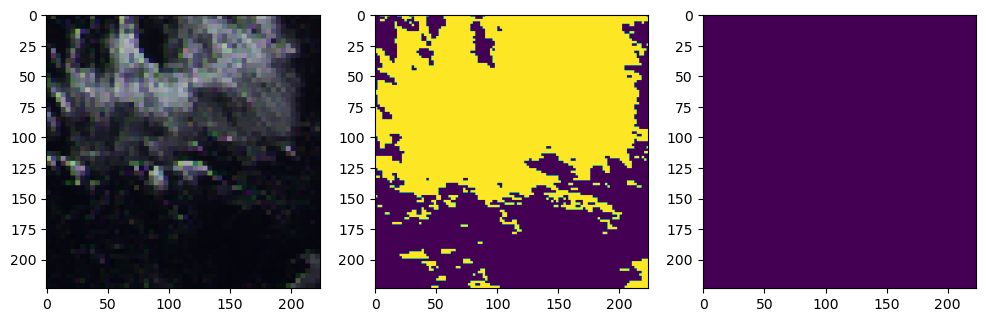

number of snowy patches in ds 266
snowy_weight = 0.980852655198205 bg_weight = 0.019147344801795065
number of non-empty patches in ds 13370
number of non-empty snowy patches in ds 256
total number of patches in ds 17280
patch_shape in ds : torch.Size([12, 224, 224])


(13370, 1755, 1768)

In [11]:
Electro_ds_full_tr = ELECTRO_L2_Dataset_finetunning(stack_dir_list=stack_dir_tr,nonempty_mode = True, include_BT = True)
Electro_ds_full_val = ELECTRO_L2_Dataset_finetunning(stack_dir_list=stack_dir_val,nonempty_mode = True, include_BT = True)
Electro_ds_full_test = ELECTRO_L2_Dataset_finetunning(stack_dir_list=stack_dir_test,nonempty_mode = True, include_BT = True)
SAMPLE_INDX = 2349
x_rgb_lonlat, mask = Electro_ds_full_tr[SAMPLE_INDX]
fig, ax = plt.subplots(1,3, figsize=(12,4))
ax[0].imshow(Electro_ds_full_tr.open_as_pil(SAMPLE_INDX))
ax[1].imshow(Electro_ds_full_tr.open_mask(SAMPLE_INDX))
ax[2].imshow(Electro_ds_full_tr.open_dem(SAMPLE_INDX))
plt.show()
num_snow_patches = np.sum(Electro_ds_full_tr.all_snow_flags)
print('number of snowy patches in ds',num_snow_patches)
non_empty_snow_patches_idxs = Electro_ds_full_tr.non_empty_snow_idxs
num_non_empty_snow_patches = len(non_empty_snow_patches_idxs)
bg_weight = num_non_empty_snow_patches/len(Electro_ds_full_tr)
snowy_weight = 1- num_non_empty_snow_patches/len(Electro_ds_full_tr)
print('snowy_weight =',snowy_weight, 'bg_weight =',bg_weight)
print('number of non-empty patches in ds',len(Electro_ds_full_tr))
print('number of non-empty snowy patches in ds',len(non_empty_snow_patches_idxs))
print('total number of patches in ds',len(Electro_ds_full_tr.all_snow_flags))
print('patch_shape in ds :',x_rgb_lonlat.shape)
len(Electro_ds_full_tr.all_snow_flags_nonempty), len(Electro_ds_full_val), len(Electro_ds_full_test)

snow_pix_sum = 2236


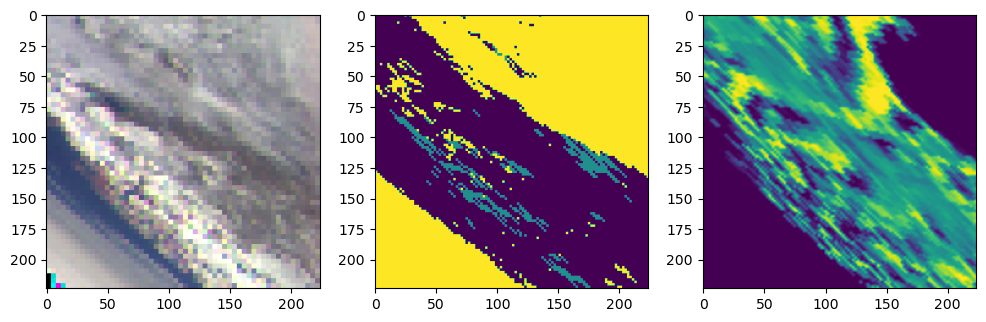

snow_pix_sum = 1812


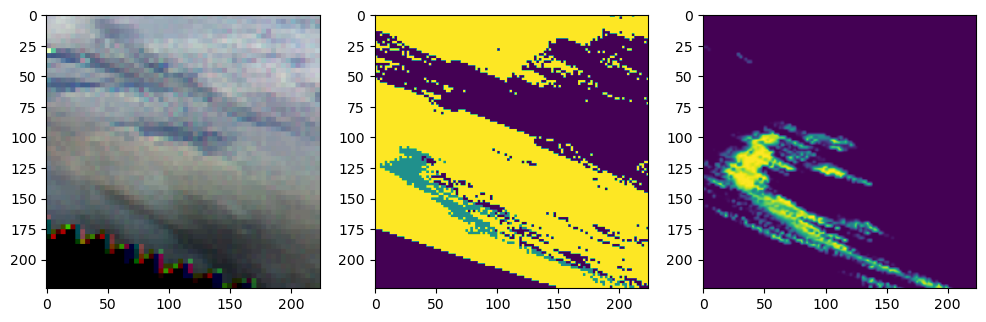

snow_pix_sum = 6396


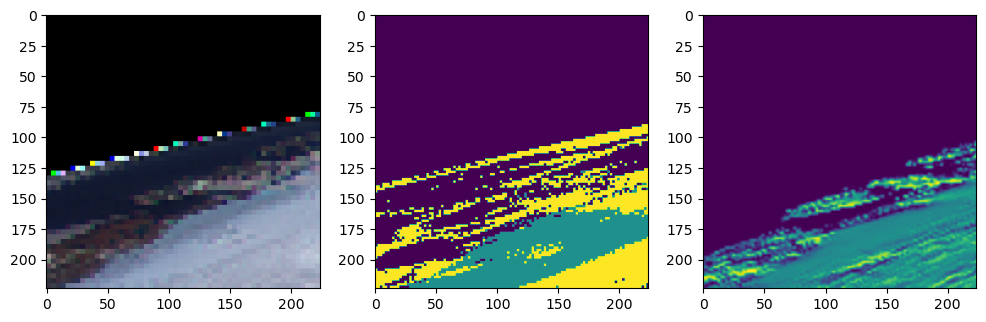

snow_pix_sum = 4328


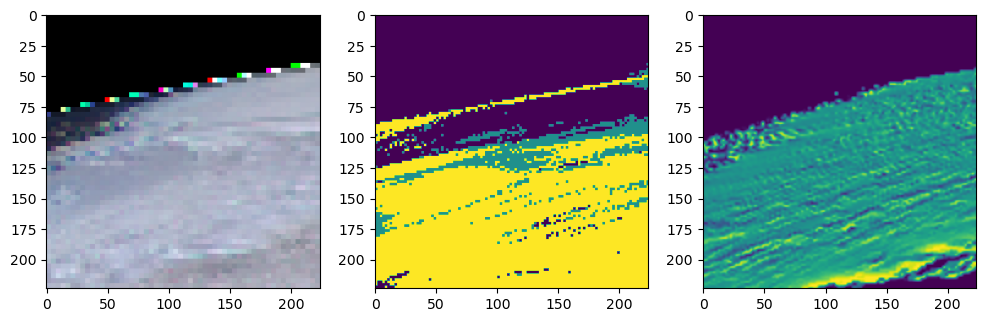

snow_pix_sum = 9304


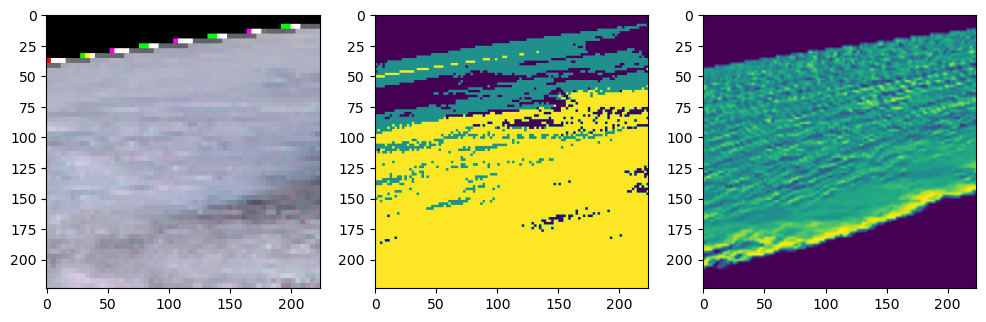

snow_pix_sum = 1348


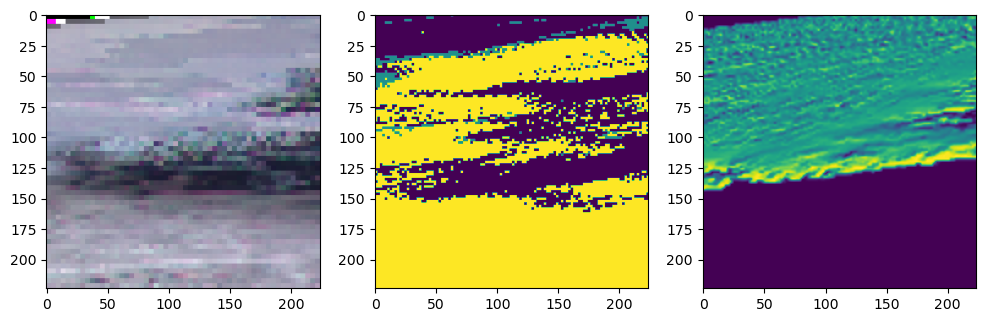

snow_pix_sum = 1276


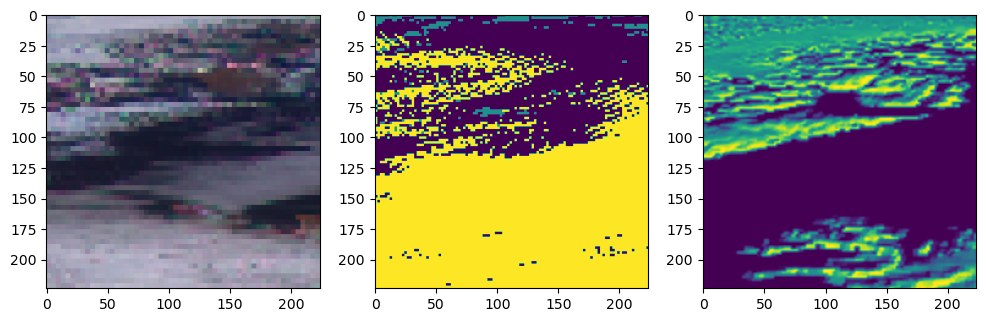

snow_pix_sum = 1156


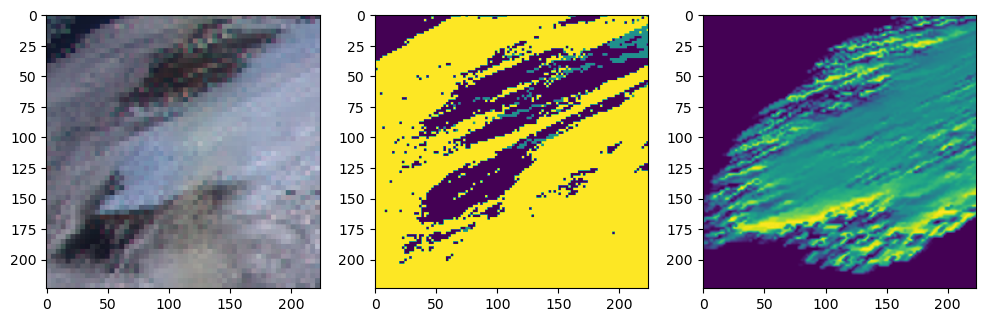

snow_pix_sum = 1896


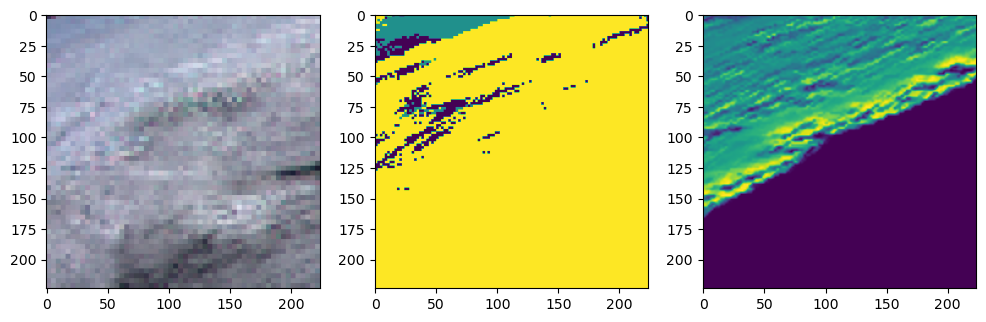

snow_pix_sum = 1264


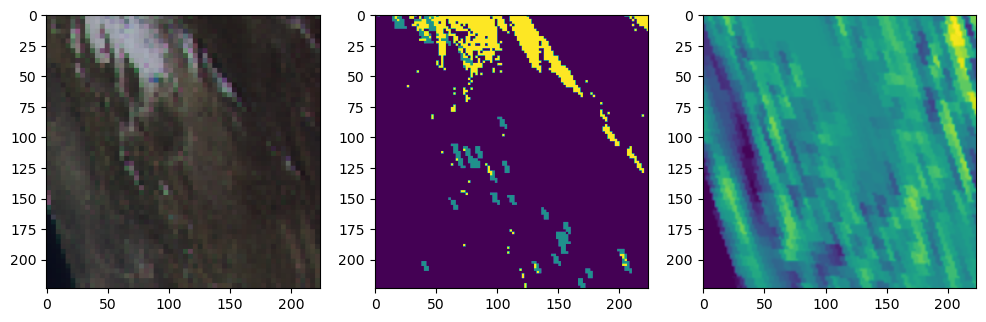

In [12]:
for SAMPLE_INDX in non_empty_snow_patches_idxs[40:50]:
    x_rgb_lonlat, mask = Electro_ds_full_tr[SAMPLE_INDX]
    snow_mask = mask.numpy().copy()
    snow_mask[snow_mask!=1]=0
    snow_pix_sum = np.sum(snow_mask)
    print('snow_pix_sum =', snow_pix_sum)
    fig, ax = plt.subplots(1,3, figsize=(12,4))
    ax[0].imshow(Electro_ds_full_tr.open_as_pil(SAMPLE_INDX))
    ax[1].imshow(Electro_ds_full_tr.open_mask(SAMPLE_INDX))
    ax[2].imshow(Electro_ds_full_tr.open_dem(SAMPLE_INDX))
    plt.show()

### Define Kornia Augmentation piupeline and WeightedRandomSampler for Training Dataset

**DEFINE A PIPELINE CLASS OF GEOMETRIC TRANSFORM ON GPU USING Kornia**

In [13]:
class Geom_Augmentation(nn.Module):
    def __init__(self):
        super(Geom_Augmentation, self).__init__()
        # we define and cache our operators as class members
        self.augs = AugmentationSequential(
                    RandomVerticalFlip(p=1),
                    RandomHorizontalFlip(p=1),
                    RandomPerspective(0.5, p=1.),
                    RandomAffine((-80.0,80.0),(0, 0.1),(1, 1.71),resample="nearest",padding_mode="reflection",align_corners=True,same_on_batch=False,keepdim=True,p=1),
                    RandomElasticTransform(kernel_size=(33, 33), sigma=(6.0, 6.0), alpha=(1.0, 1.0), align_corners=True, resample='nearest', padding_mode='reflection', same_on_batch=False, p=1.0, keepdim=True),
                    data_keys=['input', 'mask'], same_on_batch = False, random_apply = 2)                       
    def forward(self, img: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
        # 1. apply color only in image
        # 2. apply geometric tranform
        out = self.augs(img, mask)
        img_out, mask_out = out[0],out[1]
        return img_out, mask_out
geom_augs = Geom_Augmentation()

**Test Kornia augmentations sequential on the Electro dataset**

torch.Size([12, 224, 224]) torch.Size([224, 224])


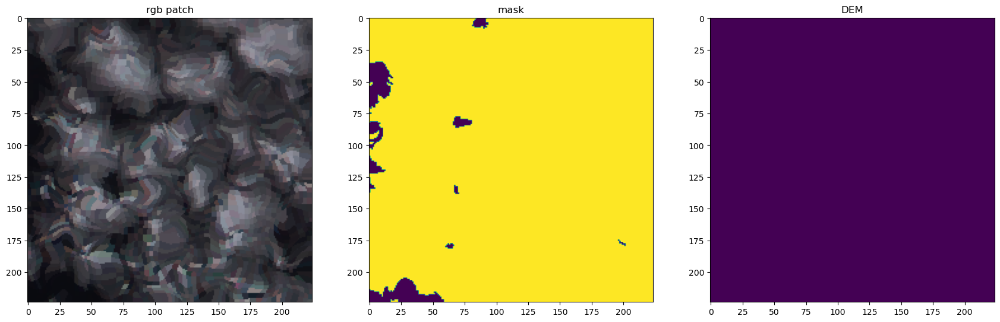

torch.Size([12, 224, 224]) torch.Size([224, 224])


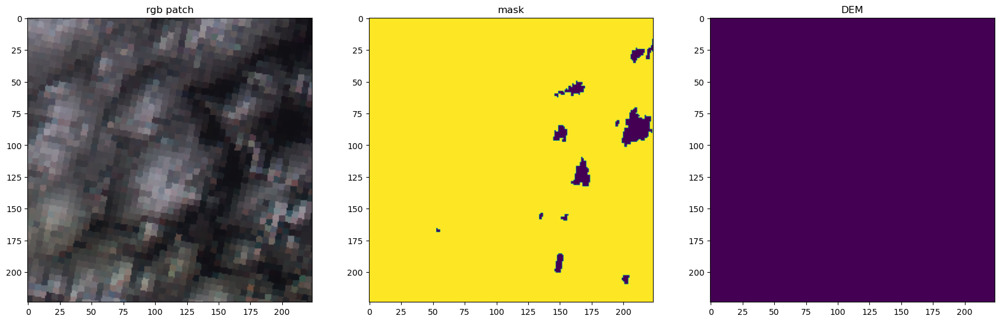

torch.Size([12, 224, 224]) torch.Size([224, 224])


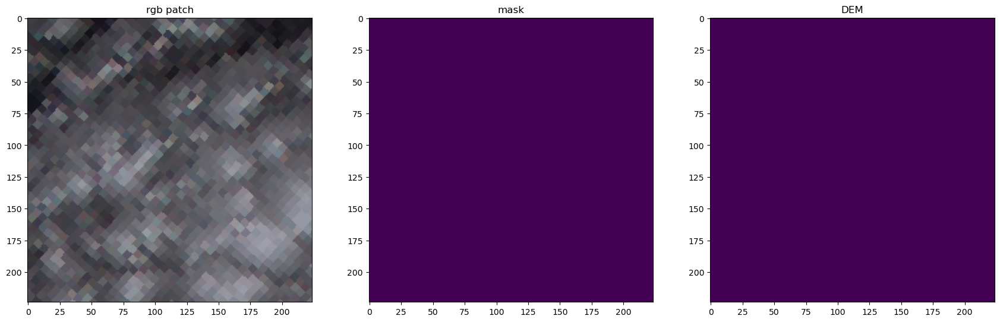

torch.Size([12, 224, 224]) torch.Size([224, 224])


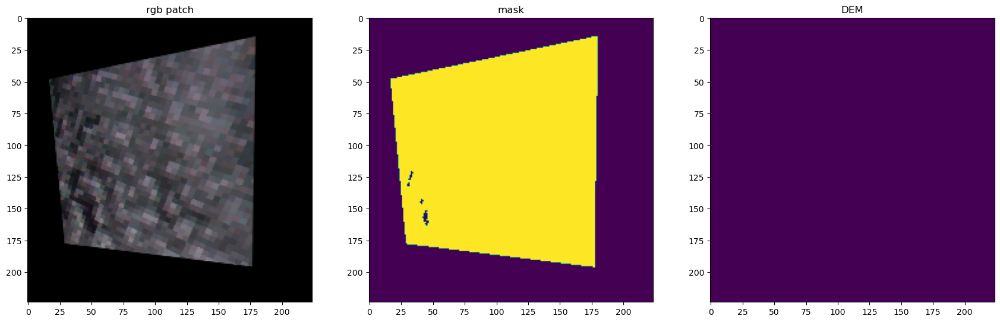

torch.Size([12, 224, 224]) torch.Size([224, 224])


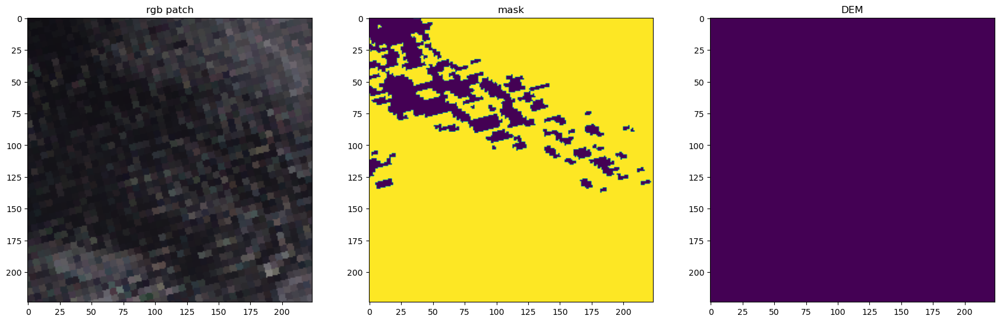

torch.Size([12, 224, 224]) torch.Size([224, 224])


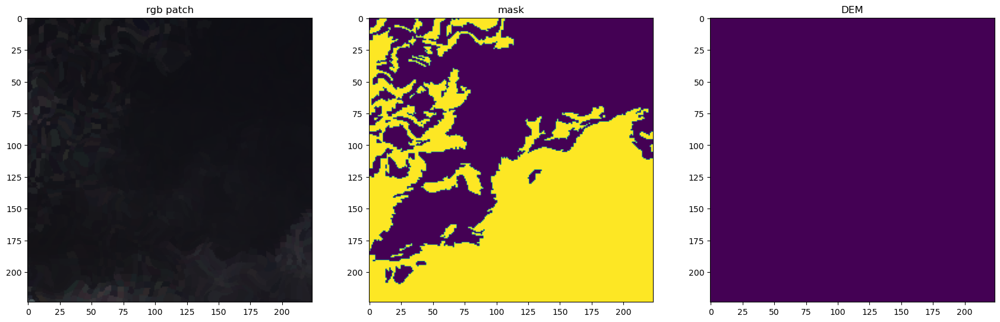

torch.Size([12, 224, 224]) torch.Size([224, 224])


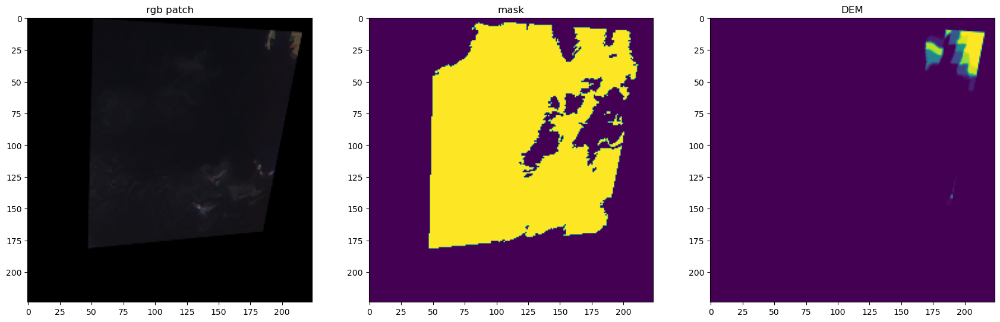

torch.Size([12, 224, 224]) torch.Size([224, 224])


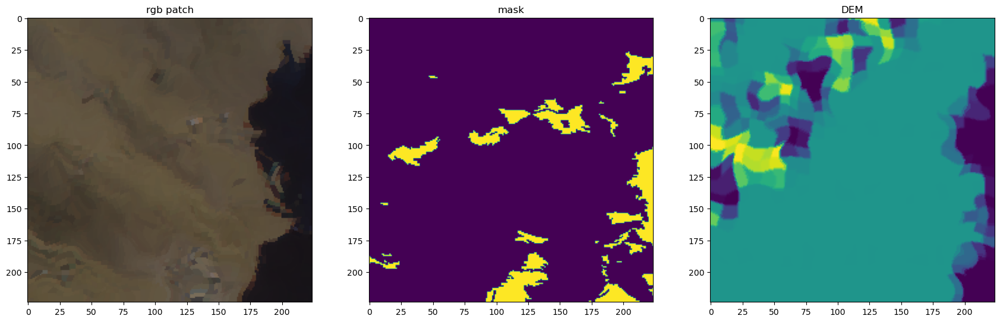

torch.Size([12, 224, 224]) torch.Size([224, 224])


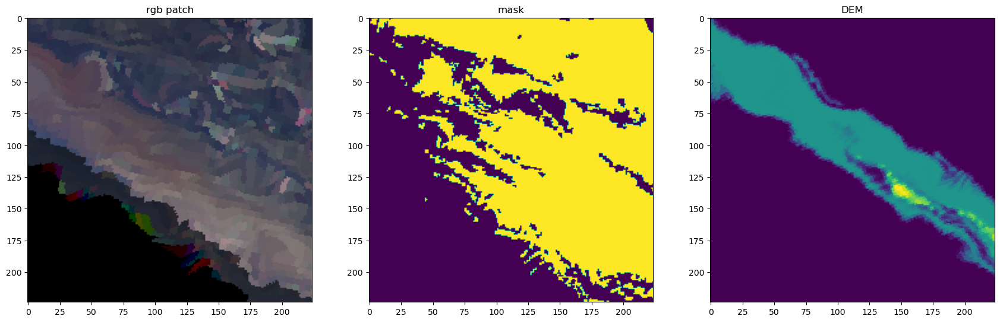

torch.Size([12, 224, 224]) torch.Size([224, 224])


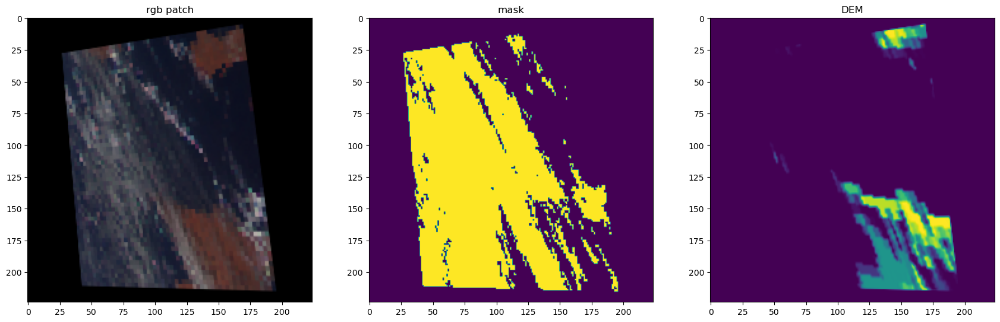

torch.Size([12, 224, 224]) torch.Size([224, 224])


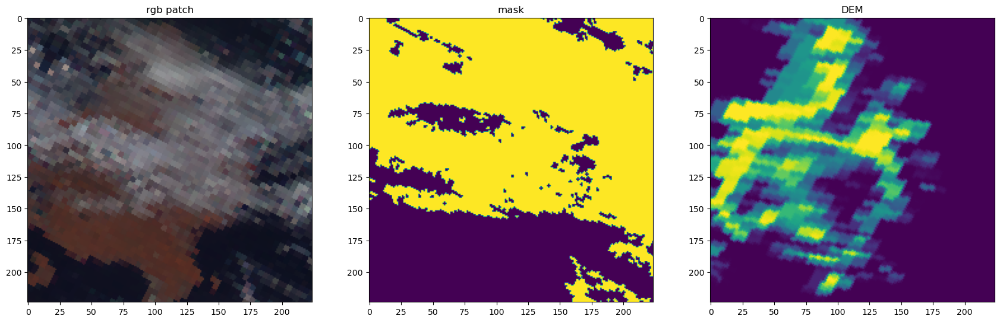

torch.Size([12, 224, 224]) torch.Size([224, 224])


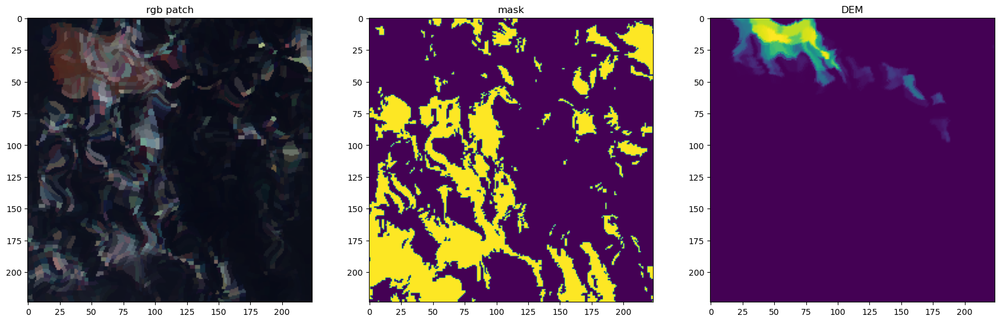

torch.Size([12, 224, 224]) torch.Size([224, 224])


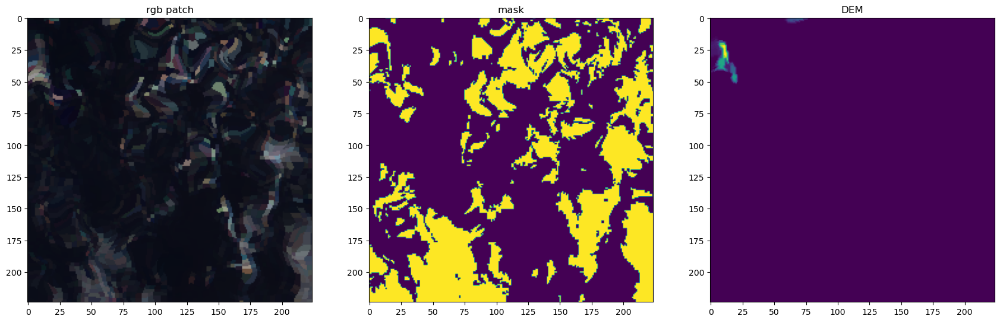

torch.Size([12, 224, 224]) torch.Size([224, 224])


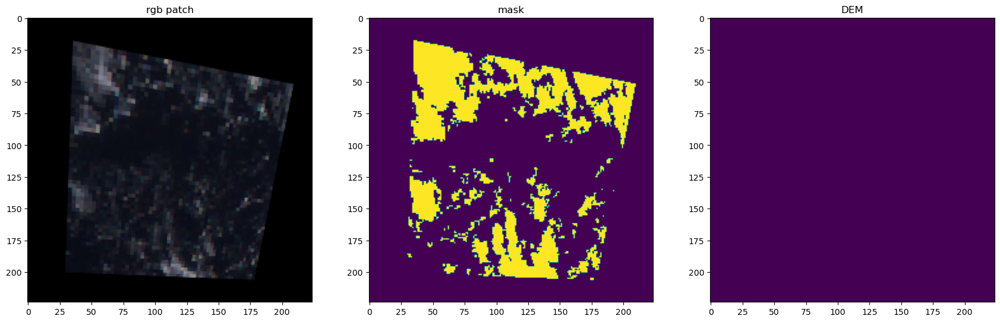

torch.Size([12, 224, 224]) torch.Size([224, 224])


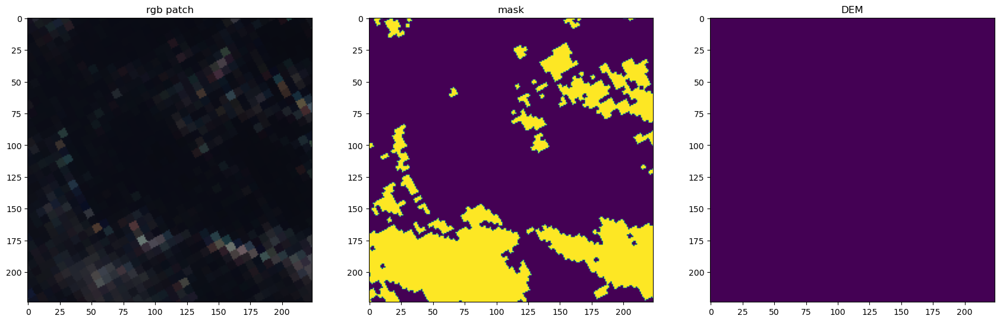

torch.Size([12, 224, 224]) torch.Size([224, 224])


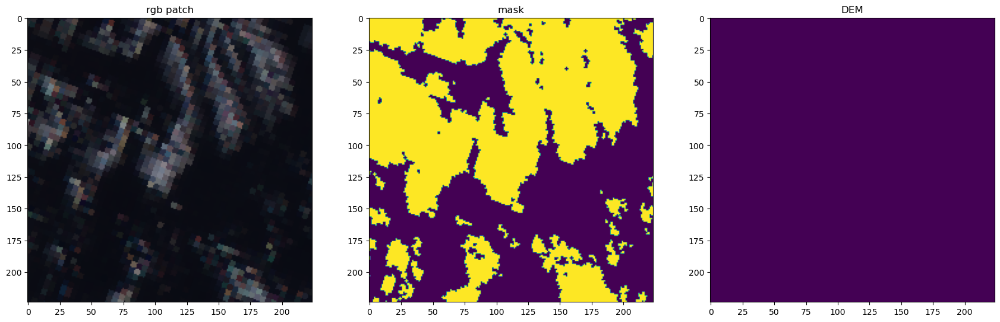

torch.Size([12, 224, 224]) torch.Size([224, 224])


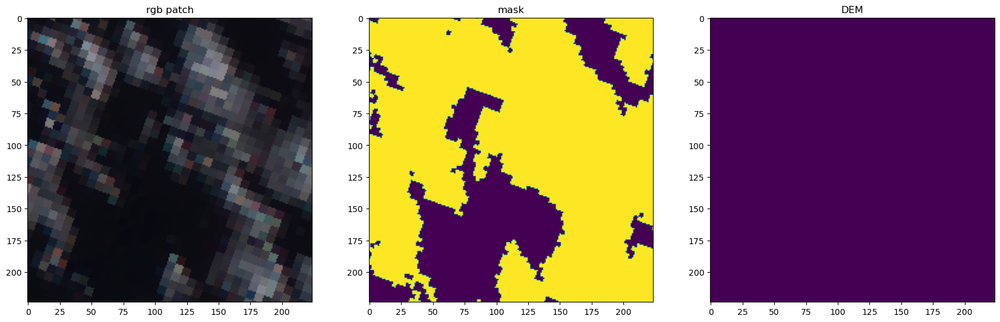

torch.Size([12, 224, 224]) torch.Size([224, 224])


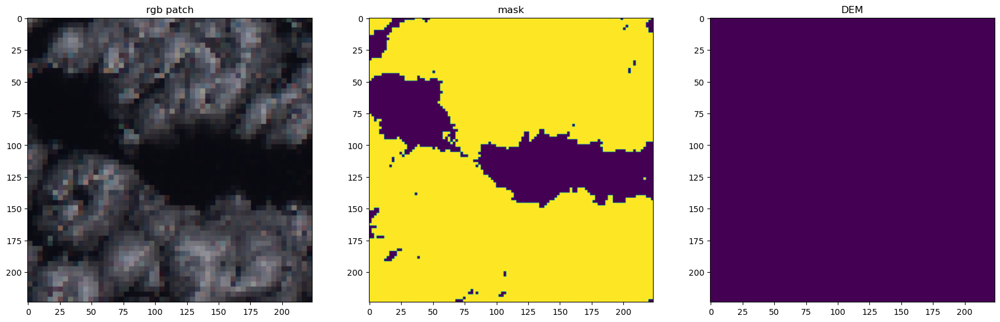

torch.Size([12, 224, 224]) torch.Size([224, 224])


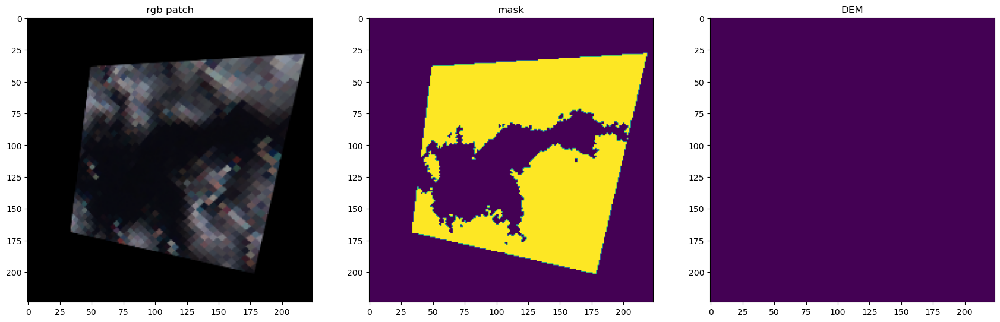

torch.Size([12, 224, 224]) torch.Size([224, 224])


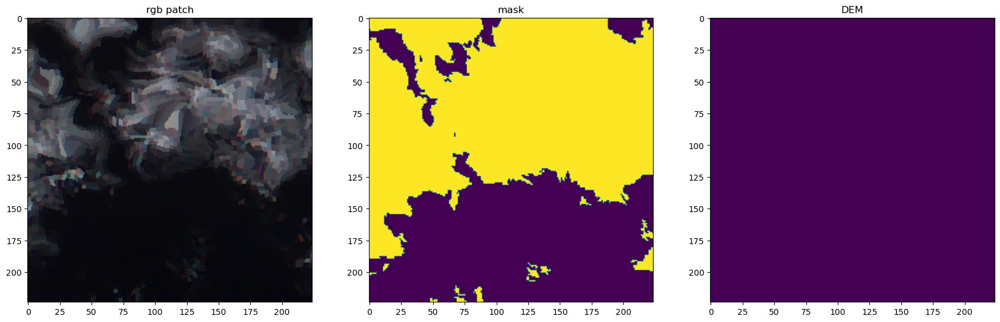

In [14]:
for idx in range(230,250):
    datacube, seglabel = Electro_ds_full_tr[idx]
    print(datacube.shape, seglabel.shape)
    # APPLY GEOM AUGS
    datacube, seglabel = geom_augs(datacube, seglabel.type(torch.float32))
    # NEED TO UNDERSTAND GEOM AUGS PARAMS To MAKE IT ACCEPTABLE!
    datacube, seglabel = datacube.squeeze(0), seglabel.squeeze(0).squeeze(0)
    fig, ax = plt.subplots(1,3, figsize=(21,7))
    ax[0].imshow(open_sample_as_pil_no_norm(datacube.cpu()))
    ax[1].imshow(open_mask_as_pil(seglabel.cpu()))
    ax[2].imshow(open_DEM(datacube.cpu()))
    ax[0].set_title('rgb patch')
    ax[1].set_title('mask')
    ax[2].set_title('DEM')
    plt.show()

**USE WEIGHTED SAMPLER TO MAKE DATALOADER MORE BALANCED WITH SNOW PATCHES**

In [15]:
#SAMPLER FOR ELECTRO L2 DS FOR FINETUNNING
non_empty_snow_patches_ds = Electro_ds_full_tr.all_snow_flags_nonempty
num_non_empty_snow_patches = len(non_empty_snow_patches_ds)
bg_weight = num_non_empty_snow_patches/len(Electro_ds_full_tr)
snowy_weight = 1- num_non_empty_snow_patches/len(Electro_ds_full_tr)
batch_size = 16
_, counts = torch.unique(torch.tensor(non_empty_snow_patches_ds), return_counts=True)
weights = counts.max() / counts
print("Weights: ", weights)
weight_for_sampler_l2 = []  # Every sample must have a weight
for snow_flag in non_empty_snow_patches_ds:
    weight_for_sampler_l2.append(weights[snow_flag].item())
print('len(weights):',len(weight_for_sampler_l2), weight_for_sampler_l2[0:20])
sampler_l2 = WeightedRandomSampler(torch.tensor(weight_for_sampler_l2), len(Electro_ds_full_tr))

Weights:  tensor([ 1.0000, 51.2266])
len(weights): 13370 [1.0, 61.47187805175781, 61.47187805175781, 61.47187805175781, 61.47187805175781, 61.47187805175781, 1.0, 1.0, 61.47187805175781, 61.47187805175781, 61.47187805175781, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


In [16]:
# ELECTRO L2 ds full for finetunning
batch_size = 16 #16 # try to set as max as possible
train_dl_ = DataLoader(Electro_ds_full_tr, batch_size=batch_size, sampler = sampler_l2)
valid_dl_ = DataLoader(Electro_ds_full_val, batch_size=batch_size, shuffle=False)
test_dl_ = DataLoader(Electro_ds_full_test, batch_size=batch_size, shuffle=False)

In [17]:
len(Electro_ds_full_tr),len(Electro_ds_full_val),len(Electro_ds_full_test)

(13370, 1755, 1768)

**TEST DATALOADER SAMPLER FOR SNOWY PATHES**

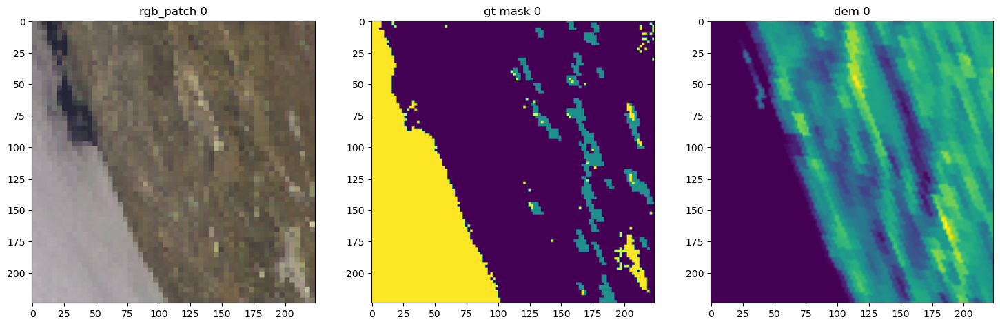

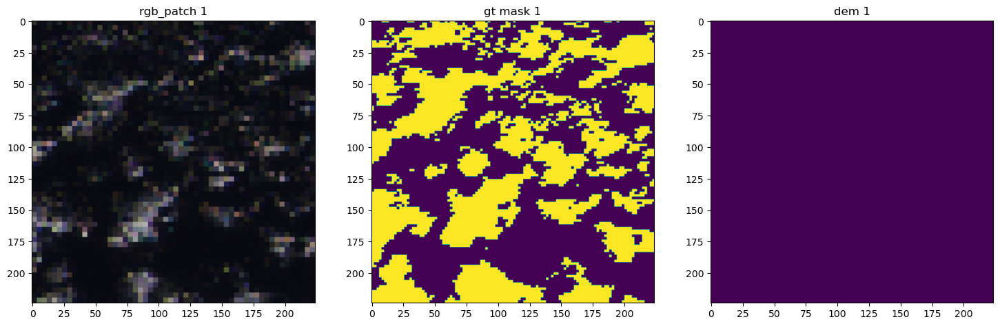

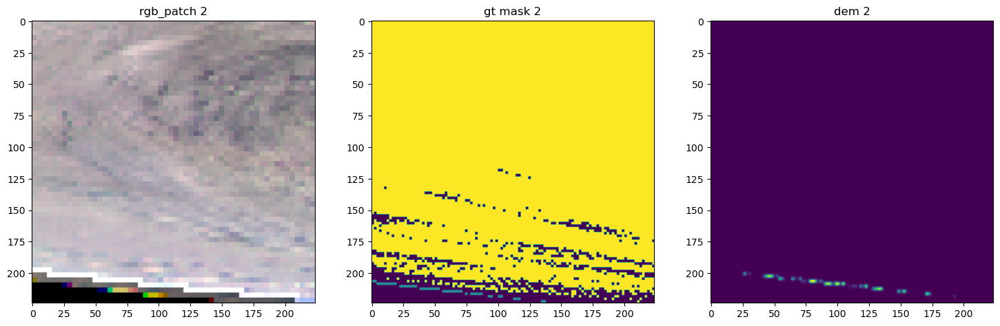

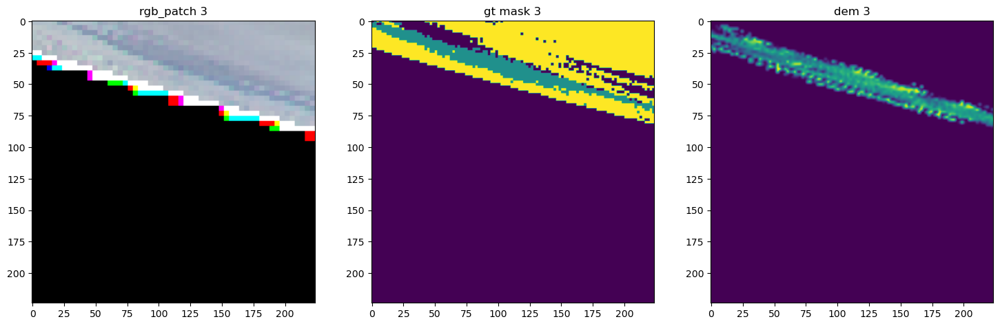

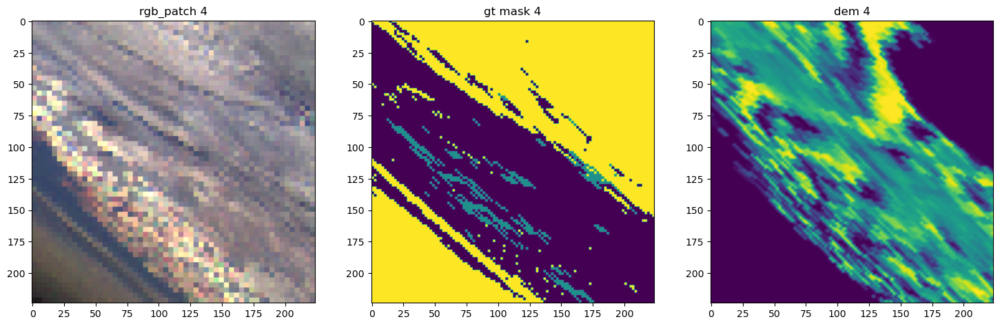

...

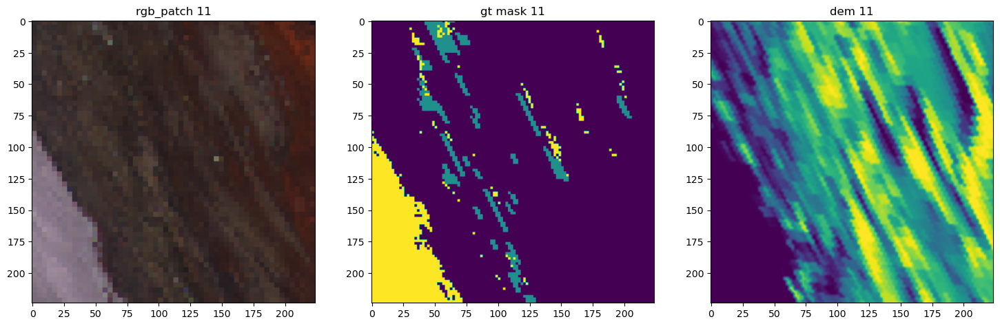

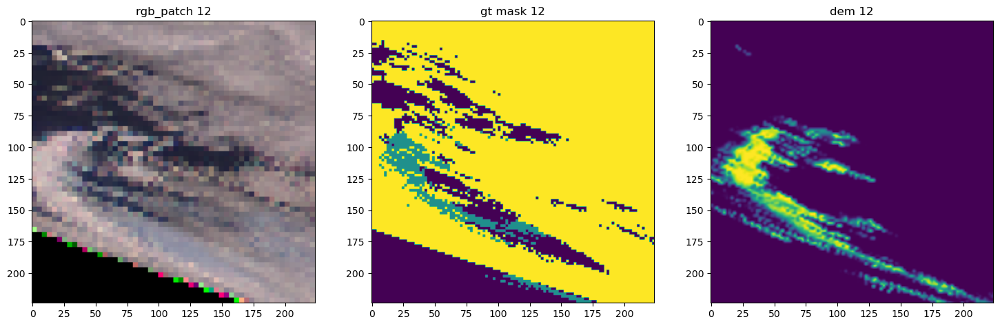

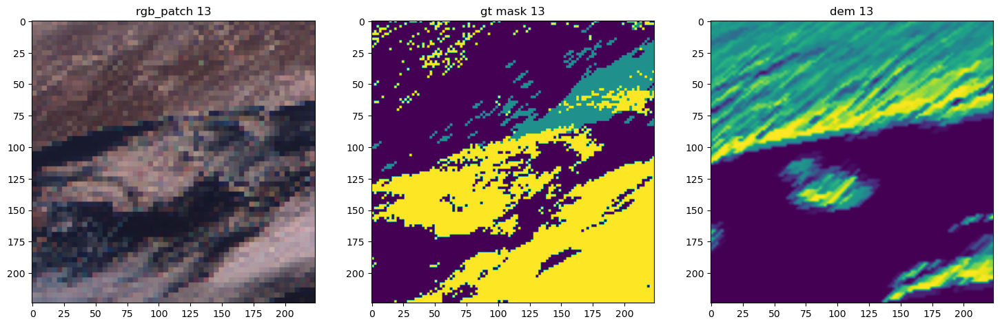

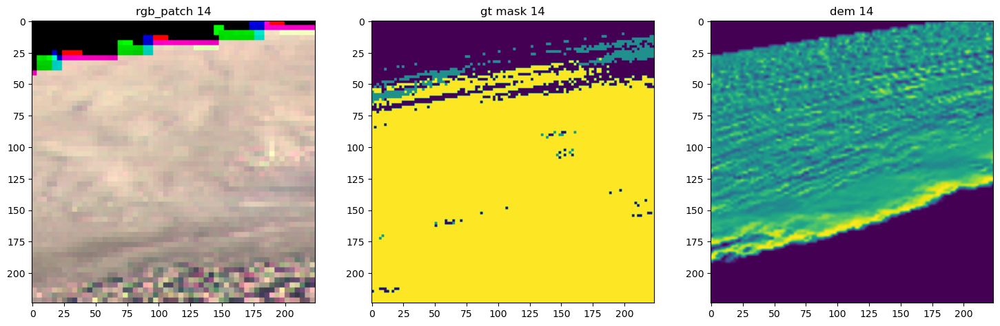

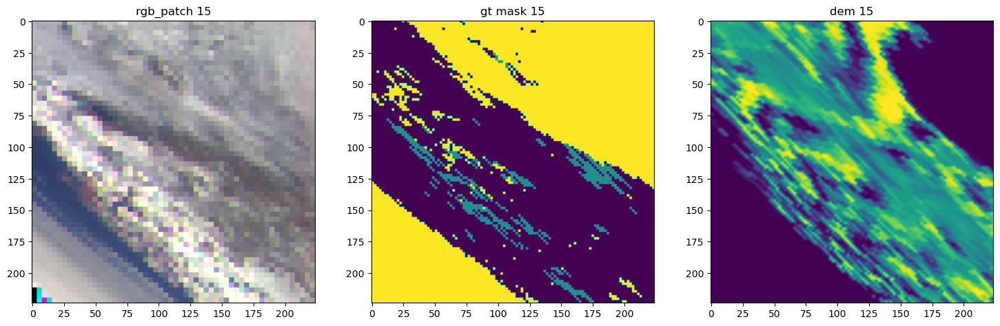

In [18]:
def visualize_dl_sampler(dl, num_batches = 1):
    iterator = iter(dl)
    for j in range(num_batches):
        x,y = next(iterator)
        for i in range(len(x)):
            x_rgb_lonlat,gt = x[i], y[i]#.to(device)
            fig, ax = plt.subplots(1,3, figsize=(18,6))
            ax[0].imshow(open_sample_as_pil_no_norm(x_rgb_lonlat.cpu()))
            ax[1].imshow(open_mask_as_pil(gt.cpu()))
            ax[2].imshow(x_rgb_lonlat[5].numpy())
            ax[0].set_title('rgb_patch '+str(i))
            ax[1].set_title('gt mask '+str(i))
            ax[2].set_title('dem '+str(i))
            plt.show()
visualize_dl_sampler(dl = train_dl_,num_batches =2)

### Define function for trainin 1 epoch and saving best model according IoU metric value on Validation subset

**TRY TO USE RANGER21 OPTIMIZER INSTEAD OF ADAMW**

In [32]:
def save_best_model(model,epoch,path =  r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_'):
        model_copy = deepcopy(model)
        best_model = model_copy
        best_model_name = path+str(epoch)
        torch.save(best_model.state_dict(),best_model_name)
        print('best model is on epoch =',epoch)
        return best_model
def train_ep_levir(model, train_dataload, valid_dataload, dice, focal,focal_alpha, optimizer,ep_i, best_valid_iou, scheduler =None):    
    model.cuda()
    print('epoch_n =',ep_i)
    model.train(True)  
    step = 0
    train_loss = 0
    #initialize metrics
    train_f1_score = torchmetrics.F1Score(num_classes=3, task = 'multiclass').cuda()
    train_iou_score = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass').cuda()
    train_f1_score_sep = torchmetrics.F1Score(num_classes=3, task = 'multiclass', average = None).cuda()
    train_iou_score_sep = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass', average = None).cuda()
    val_f1_score = torchmetrics.F1Score(num_classes=3, task = 'multiclass').cuda()
    val_iou_score = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass').cuda()
    val_f1_score_sep = torchmetrics.F1Score(num_classes=3, task = 'multiclass', average = None).cuda()
    val_iou_score_sep = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass', average = None).cuda()
    val_acc = torchmetrics.Accuracy(num_classes=3, task = 'multiclass').cuda()
    # iterate over data
    print('-----------training process---------')
    for x,y in tqdm(train_dataload): 
        x = torch.tensor(x).type(torch.float32).cuda()
        y = torch.tensor(y).type(torch.float32).cuda()
        #add geom augmentations on GPU from kornia
        x, y = geom_augs(x, y.unsqueeze(1)) #convert labels to float32 for kornia !!!!
        y = y.type(torch.LongTensor).squeeze(1).cuda() #convert labels to Long again for model !!!!
        step += 1
        # vector graph of training with grad on CUDA
        optimizer.zero_grad()
        output = model(x)
        output = torch.functional.F.softmax(output, 1)
        predictions = output.argmax(dim=1).cuda()
        loss = (1-focal_alpha)*dice(output, y)+focal_alpha*focal(output, y)
        loss.backward()
        optimizer.step()
        # other things can be done on CPU
        loss = loss.detach()
        predictions, y = predictions.detach(), y.detach()
        train_f1_score.update(predictions, y)
        train_iou_score.update(predictions, y)
        train_f1_score_sep.update(predictions, y)
        train_iou_score_sep.update(predictions, y)
        train_loss=train_loss+loss
        x,y = None, None
        # need for torch.no_grad in this training pass
        if scheduler!=None:
            scheduler.step()
    train_loss = train_loss.cpu()/len(train_dataload)
    print('after training epoch mean train loss =',train_loss)
    # Compute the train metrics for the epoch
    train_f1 = train_f1_score.compute()
    train_iou = train_iou_score.compute()
    train_f1_sep = train_f1_score_sep.compute()
    train_iou_sep = train_iou_score_sep.compute()

    # Reset the train metrics objects for the next epoch
    train_f1_score.reset()
    train_iou_score.reset()
    train_f1_score_sep.reset()
    train_iou_score_sep.reset()
# Inside your epoch training loop, after each batch is processed, compute the metrics on the batch predictions and ground truth
    with torch.no_grad():
        val_loss = 0
        print('-----------validation process---------')
        for x,y in tqdm(valid_dataload):
            x = x.cuda()#.cuda()
            y = y.type(torch.LongTensor).cuda()
            output = model(x)
            output = torch.functional.F.softmax(output, 1)
            # Assuming output has shape (batch_size, num_classes, height, width)
            # Convert the output to predictions by taking the argmax along the channel dimension
            predictions = output.argmax(dim=1).cuda()
            valid_loss = (1-focal_alpha)*dice(output, y)+focal_alpha*focal(output, y)
            val_loss = val_loss+valid_loss
            val_f1_score.update(predictions, y)
            val_iou_score.update(predictions, y)
            val_f1_score_sep.update(predictions, y)
            val_iou_score_sep.update(predictions, y)
            val_acc.update(predictions, y)
            x,y = None, None
        val_f1 = val_f1_score.compute()
        val_iou = val_iou_score.compute()
        val_acc_ = val_acc.compute()
        #calculate the same metrics seperately for each class
        val_f1_sep = val_f1_score_sep.compute()
        val_iou_sep = val_iou_score_sep.compute()
        FAR = 1 - val_acc_
            
        # Compute the validation metrics for the epoch
        val_loss = val_loss.cpu()/(len(valid_dataload))
        print('valid loss =',val_loss)

        # Reset the validation metrics objects for the next epoch
        val_f1_score.reset()
        val_iou_score.reset()
        val_f1_score_sep.reset()
        val_iou_score_sep.reset()
        val_acc.reset()
        # Print the F1 score and IoU for the current epoch on the train and validation sets
        print('######### METRICS AFTER TRAINING EPOCH #########')
        print(f"Epoch {ep_i}, Train F1 score: {train_f1:.4f}, Train IoU: {train_iou:.4f}, Val F1 score: {val_f1:.4f}, Val IoU: {val_iou:.4f}")
        print(f"Train F1 score for each class: {train_f1_sep.cpu().numpy()}, \nTrain IoU for each class: {train_iou_sep.cpu().numpy()}")
        print(f"Test FAR: {FAR:.4f}")
        print(f"Test F1 score for each class: {val_f1_sep.cpu().numpy()}, \nTest IoU for each class: {val_iou_sep.cpu().numpy()}")
        if (best_valid_iou<val_iou) or (val_iou>0.75):
            save_best_model(model,ep_i)
            print(" model updated")
        return train_f1.cpu(),train_iou.cpu(),val_f1.cpu(),val_iou.cpu(), train_loss.cpu(), val_loss.cpu()
def test_model(model, test_dataload):
    model = model.cuda()
    test_f1_score = torchmetrics.F1Score(num_classes=3, task = 'multiclass').cuda()
    test_iou_score = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass').cuda()
    test_f1_score_sep = torchmetrics.F1Score(num_classes=3, task = 'multiclass', average = None).cuda()
    test_iou_score_sep = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass', average = None).cuda()
    test_acc = torchmetrics.Accuracy(num_classes=3, task = 'multiclass').cuda()
    with torch.no_grad():
        print('-----------Testing process---------')
        for x,y in tqdm(test_dataload):
            x = x.cuda()
            y = y.type(torch.LongTensor).cuda()
            output = model(x)
            output = torch.functional.F.softmax(output, 1)
            # Assuming output has shape (batch_size, num_classes, height, width)
            # Convert the output to predictions by taking the argmax along the channel dimension
            predictions = output.argmax(dim=1).cuda()
            test_f1_score.update(predictions, y)
            test_iou_score.update(predictions, y)
            test_f1_score_sep.update(predictions, y)
            test_iou_score_sep.update(predictions, y)
            test_acc.update(predictions, y)
            x,y = None, None
        test_f1 = test_f1_score.compute()
        test_iou = test_iou_score.compute()
        test_acc = test_acc.compute()
        #calculate the same metrics seperately for each class
        test_f1_sep = test_f1_score_sep.compute()
        test_iou_sep = test_iou_score_sep.compute()
        FAR = 1 - test_acc
        # Reset the validation metrics objects for the next epoch
        test_f1_score.reset()
        test_iou_score.reset()
        test_f1_score_sep.reset()
        test_iou_score_sep.reset()
        # Print the F1 score and IoU for the current epoch on the train and validation sets
        print(f"Test F1 score: {test_f1:.4f}, Test IoU: {test_iou:.4f}")
        print(f"Test FAR: {FAR:.4f}")
        print(f"Test F1 score for each class(bg, snow, cloud): {test_f1_sep.cpu().numpy()}, \nTest IoU for each class(bg, snow, cloud): {test_iou_sep.cpu().numpy()}")

### Initialize segmentation model, optimizer and scheduler and start traning loop over defined number of epoches

In [21]:
# lets try another architecture OVERKILL FOR ALL 12 channels
model = smp.MAnet(
    encoder_name='efficientnet-b1', 
    in_channels=12,
    classes=3,)
optimizer = optim.AdamW(model_segformer_overkill.parameters(),lr = 1e-3)
max_ep_num = 100
cur_ep = 0
scheduler = CosineAnnealingLR(optimizer, T_max=max_ep_num)
lr, weight_decay = 1e-3, 1e-4
optimizer_Ranger21 =  Ranger21(model_segformer_overkill.parameters(), lr = lr, weight_decay = weight_decay,
num_epochs = max_ep_num,num_batches_per_epoch = len(train_dl_))
model_segformer_overkill.train()
for ep_i in range(cur_ep,cur_ep+max_ep_num):
    train_f1_,train_iou_,valid_f1_,valid_iou_,train_loss_,valid_loss_= train_ep_levir(model, train_dl_, valid_dl_, dice, focal,focal_alpha,optimizer_Ranger21,ep_i,best_valid_iou_,scheduler=scheduler)
    tr_f1_.append(train_f1_)#train_f1
    val_f1_.append(valid_f1_)#val_f1
    tr_iou_.append(train_iou_)#train_iou
    val_iou_.append(valid_iou_)#val_iou
    best_valid_iou_ = max(val_iou_[1:])
    tr_loss_.append(train_loss_)
    val_loss_.append(valid_loss_)

In [ ]:
fig, ax = plt.subplots(2,3, figsize=(24,16))
ax[0][0].plot(np.arange(1,len(tr_f1_)),(tr_f1_[1:]),label='f1 train el2')
ax[0][1].plot(np.arange(1,len(tr_iou_)),(tr_iou_[1:]),label='IoU train el2')
ax[0][2].plot(np.arange(1,len(tr_loss_)+1),(tr_loss_),label='train loss el2')
ax[0][0].set_title('train f1 during training el2')
ax[0][1].set_title('train IoU during training el2')
ax[0][2].set_title('train loss during training el2')
ax[1][0].plot(np.arange(1,len(val_f1_)),(val_f1_[1:]),label='f1 valid el2')
ax[1][1].plot(np.arange(1,len(val_iou_)),(val_iou_[1:]),label='IoU valid el2')
ax[1][2].plot(np.arange(1,len(val_loss_)+1),(val_loss_),label='valid loss el2')
ax[1][0].set_title('valid f1 during training el2')
ax[1][1].set_title('valid IoU during training el2')
ax[1][2].set_title('valid loss during training el2')
plt.show()

**FINETUNNING MANet trained on GOES_ds using ELECTRO ds**

### Magic with souping several model weights, saved on different epoches during training to get better stats

**LETS BLEND SAVED MODELS via MODELS.SOUP**

In [104]:
def greedy_soup(model, path, data, metric, device = "cpu", update_greedy = False, compare = np.greater_equal, by_name = False, digits = 4, verbose = True, y_true = "y_true"):
    try:
        import torch
    except:
        print("If you want to use 'Model Soup for Torch', please install 'torch'")
        return model
    if not isinstance(path, list):
        path = [path]
    score, soup = None, []
    model = model.to(device)
    model.eval()
    model_dict = model.state_dict()
    input_key = [key for key in inspect.getfullargspec(model.forward).args if key !=  "self"]
    input_cnt = len(input_key)
    for i, model_path in enumerate(path):
        if update_greedy:
            weight = torch.load(model_path, map_location = device)
            weight_dict = weight.state_dict() if hasattr(weight, "state_dict") else weight
            if by_name:
                weight_dict = {k:v for k, v in weight_dict.items() if k in model_dict}
            if len(soup) != 0:
                weight_dict = {key:(torch.sum(torch.stack([weight_dict[key], soup[key]]), axis = 0) / 2).type(weight_dict[key].dtype)  for key in model_dict.keys()}
            model_dict.update(weight_dict)
            model.load_state_dict(model_dict)
        else:
            model = uniform_soup(model, soup + [model_path], device = device, by_name = by_name)
        iterator = iter(data)
        history = []
        step = 0
        start_time = time.time()
        while True:
            try:
                text = ""
                iter_data = next(iterator)
                if not isinstance(iter_data, dict):
                    x = iter_data[:input_cnt]
                    y = list(iter_data[input_cnt:])
                    y = [d.to(device) if isinstance(d, torch.Tensor) else d for d in y]
                    d_cnt = len(y[0])
                else:
                    x = [iter_data[k] for k in input_key if k in iter_data]
                x = [d.to(device) if isinstance(d, torch.Tensor) else d for d in x]
                step += 1
                with torch.no_grad():
                    logits = model(*x)
                    if isinstance(logits, torch.Tensor):
                        logits = [logits]
                        
                    if isinstance(iter_data, dict):
                        metric_key = [key for key in inspect.getfullargspec(func).args if key !=  "self"]
                        if len(metric_key) == 0:
                            metric_key = [y_true]
                        y = [iter_data[k] for k in metric_key if k in iter_data]
                        y = [d.to(device) if isinstance(d, torch.Tensor) else d for d in y]
                        d_cnt = len(y[0])
                    metric_val = np.array(metric(*(y + logits)))
                    if np.ndim(metric_val) == 0:
                        metric_val = [float(metric_val)] * d_cnt
                    history += list(metric_val)
                    #del y, logits

                if verbose:
                    sys.stdout.write("\r[{name}] step: {step} - time: {time:.2f}s - {key}: {val:.{digits}f}".format(name = os.path.basename(model_path), step = step, time = (time.time() - start_time), key = metric.__name__ if hasattr(metric, "__name__") else str(metric), val = np.nanmean(history), digits = digits))
                    sys.stdout.flush()
            except StopIteration:
                print("")
                break
        if 0 < len(history) and (score is None or compare(np.nanmean(history), score)):
            score = np.nanmean(history)
            if update_greedy:
                soup = weight_dict
            else:
                soup += [model_path]
    if len(soup) != 0:
        if update_greedy:
            model_dict.update(soup)
            model.load_state_dict(model_dict)
        else:
            model = uniform_soup(model, soup, device = device, by_name = by_name)
        if verbose:
            print("greedy soup best score : {val:.{digits}f}".format(val = score, digits = digits))
    return model

In [36]:
# PREPARE A KIST OF SEVERAL MODELS WITH THE SAME ARCHITECTURE TO SOUP THEIR WEIGHTS
model_path1 = r'H:/GOES_16_17_DATASET/models/MAnet_Efficient_b1_12ch_inputs_ep_81'#r'H:/LEVIR_CS/models/U-Net_efnet_b0_7_inputs_ep_78'
model_path2 = r'H:/GOES_16_17_DATASET/models/MAnet_Efficient_b1_12ch_inputs_ep_74'#r'H:/LEVIR_CS/models/U-Net_efnet_b0_7_inputs_ep_70'
model_path3 = r'H:/GOES_16_17_DATASET/models/MAnet_Efficient_b1_12ch_inputs_ep_73'#r'H:/LEVIR_CS/models/U-Net_efnet_b0_7_inputs_ep_121'
model_path4 = r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ep_63'#r'H:/LEVIR_CS/models/U-Net_efnet_b0_7_inputs_ep_86'
model_path5 = r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ep_90'#r'H:/LEVIR_CS/models/U-Net_efnet_b0_7_inputs_ep_105'
model_path6 = r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ep_94'
model_path7 = r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_179'
model_path8 = r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_189'
model_path9 = r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_195'
model_path_list = [model_path4, model_path5, model_path6, model_path7,model_path8,model_path9]
model_path_list = [model_path7,model_path8,model_path9]
for i, model_path in enumerate(model_path_list):
    print(model_path)

H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_179
H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_189
H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_195


In [37]:
def metric(y_true, y_pred):
    test_iou_score = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass').cuda()
    predictions = y_pred.argmax(dim=1).cuda()
    test_iou_score.update(predictions, y_true.cuda())
    test_iou = test_iou_score.compute()
    return test_iou.cpu()
def uniform_soup(model, path, device = "cpu", by_name = False):
    try:
        import torch
    except:
        print("If you want to use 'Model Soup for Torch', please install 'torch'")
        return model
        
    if not isinstance(path, list):
        path = [path]
    model = model.to(device)
    model_dict = model.state_dict()
    soups = {key:[] for key in model_dict}
    for i, model_path in enumerate(path):
        weight = torch.load(model_path, map_location = device)
        weight_dict = weight.state_dict() if hasattr(weight, "state_dict") else weight
        if by_name:
            weight_dict = {k:v for k, v in weight_dict.items() if k in model_dict}
        for k, v in weight_dict.items():
            soups[k].append(v)
    if 0 < len(soups):
        soups = {k:(torch.sum(torch.stack(v), axis = 0) / len(v)).type(v[0].dtype) for k, v in soups.items() if len(v) != 0}
        model_dict.update(soups)
        model.load_state_dict(model_dict)
    return model

print("\n[Uniform Soup Performance]")
uniform_model = uniform_soup(model, model_path_list, device = device)
test_model(uniform_model, test_dl_)


[Uniform Soup Performance]
-----------Testing process---------


100%|████████████████████████████████████████████████████████████████████████████████| 111/111 [00:43<00:00,  2.57it/s]

Test F1 score: 0.8721, Test IoU: 0.6960
Test FAR: 0.1279
Test F1 score for each class(bg, snow, cloud): [0.8370431 0.7161219 0.8952417], 
Test IoU for each class(bg, snow, cloud): [0.71975416 0.5577803  0.81035084]


In [38]:
def save_souped_model(model,num_models=4, path =  r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_souped'):
        model_copy = deepcopy(model)
        best_model = model_copy
        best_model_name = path+'_179_189_195_ep'
        torch.save(best_model.state_dict(),best_model_name)
        print('souped model saved!')
        return best_model
save_souped_model(uniform_model)

souped model saved!


MAnet(
  (encoder): EfficientNetEncoder(
    (_conv_stem): Conv2dStaticSamePadding(
      12, 32, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d((0, 1, 0, 1))
    )
    (_bn0): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          32, 32, kernel_size=(3, 3), stride=[1, 1], groups=32, bias=False
          (static_padding): ZeroPad2d((1, 1, 1, 1))
        )
        (_bn1): BatchNorm2d(32, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          32, 8, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          8, 32, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_project_conv): Conv2dStaticSamePaddi

### Testing saved model on Test Dataset and check segmenation quality on several patches visually as well

In [35]:
model_path = r'H:/GOES_16_17_DATASET/models/finetunned_MAnet_Efficient_b1_12ch_inputs_ZSA_ep_195'#r'H:/LEVIR_CS/models/U-Net_segformer_7_inputs_ep_47'
model.load_state_dict(torch.load(model_path))
model.eval()
test_model(model, test_dl_)

-----------Testing process---------


100%|████████████████████████████████████████████████████████████████████████████████| 111/111 [00:43<00:00,  2.54it/s]

Test F1 score: 0.8699, Test IoU: 0.6834
Test FAR: 0.1301
Test F1 score for each class(bg, snow, cloud): [0.8326869  0.69123095 0.8941856 ], 
Test IoU for each class(bg, snow, cloud): [0.7133365  0.52815354 0.80862176]


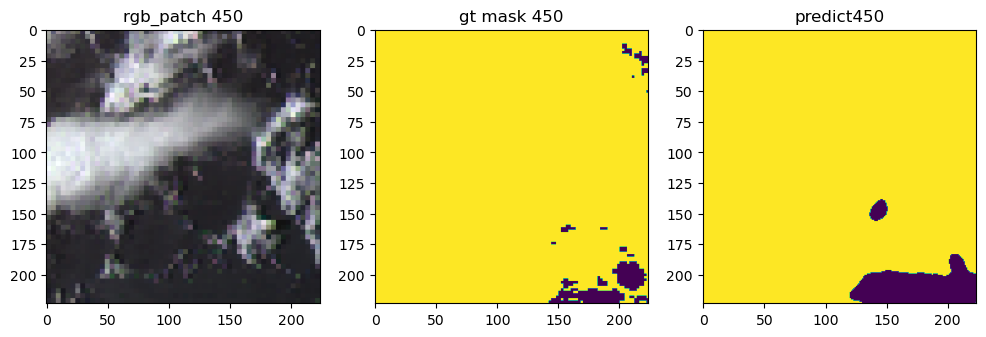

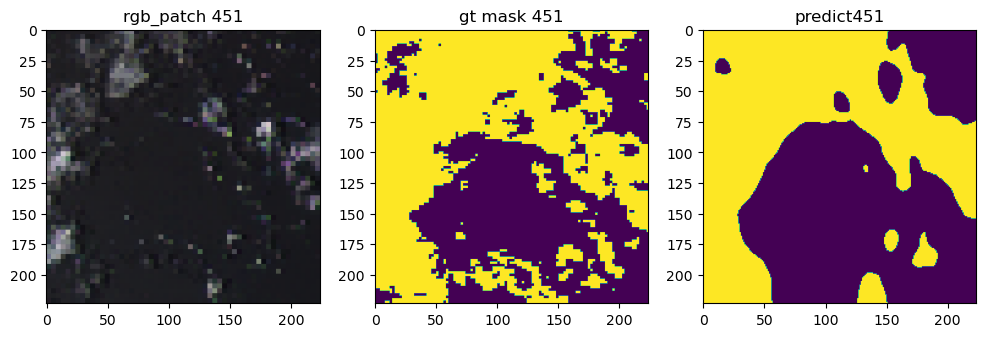

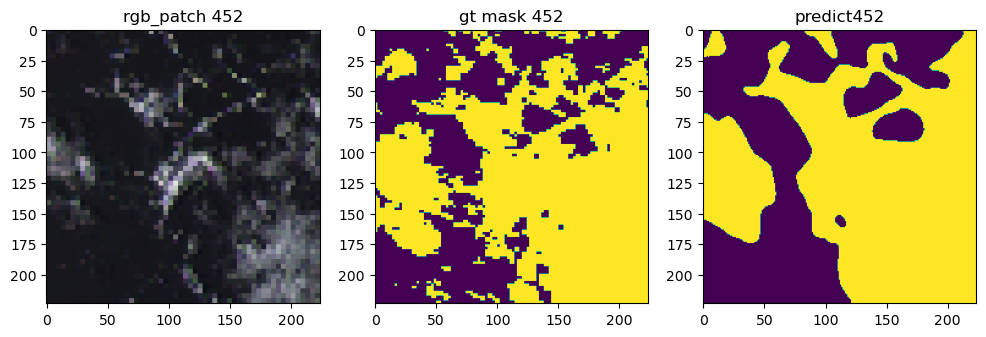

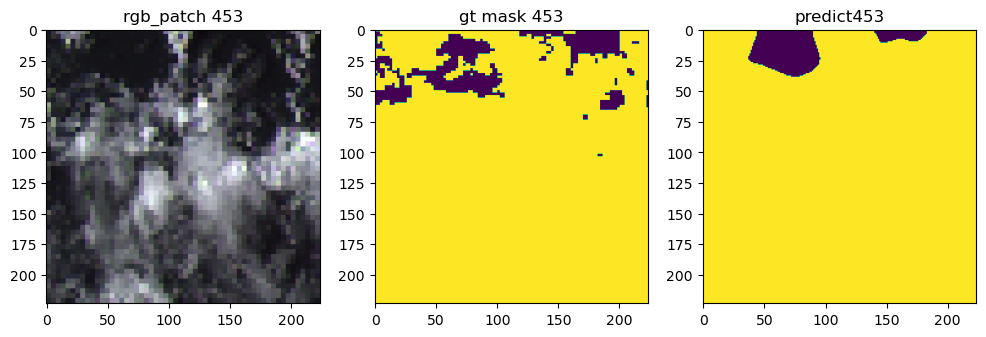

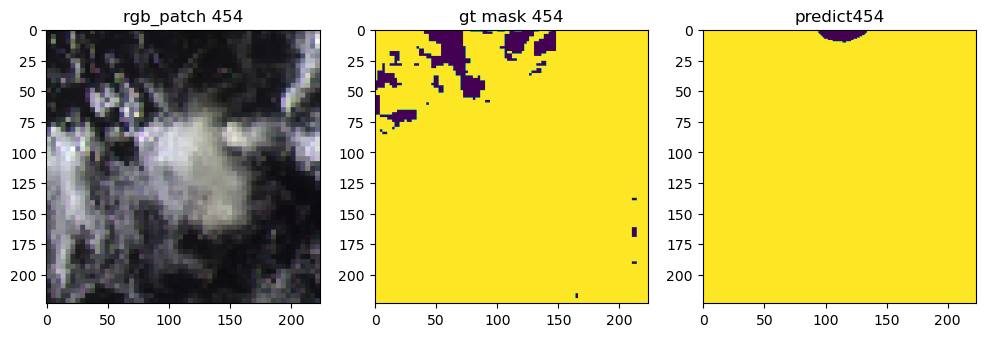

...

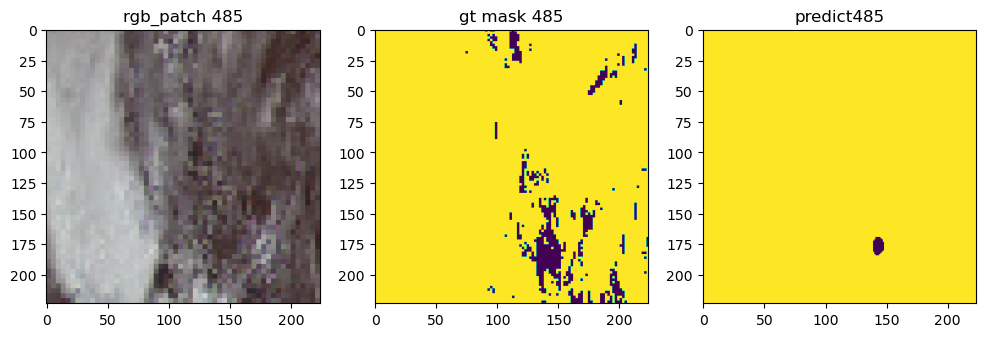

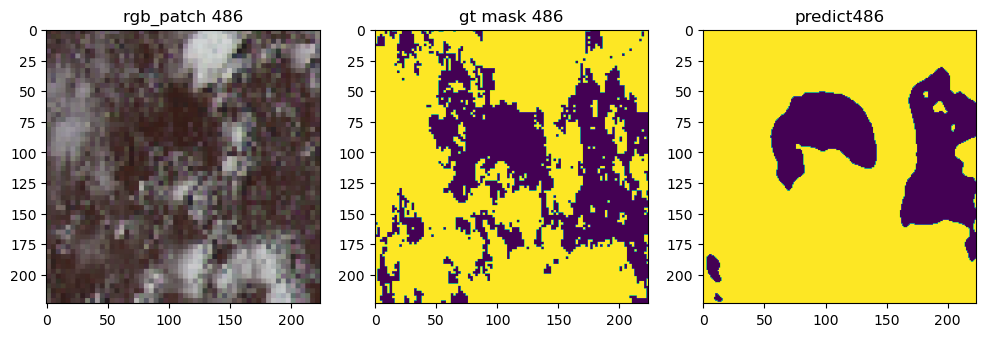

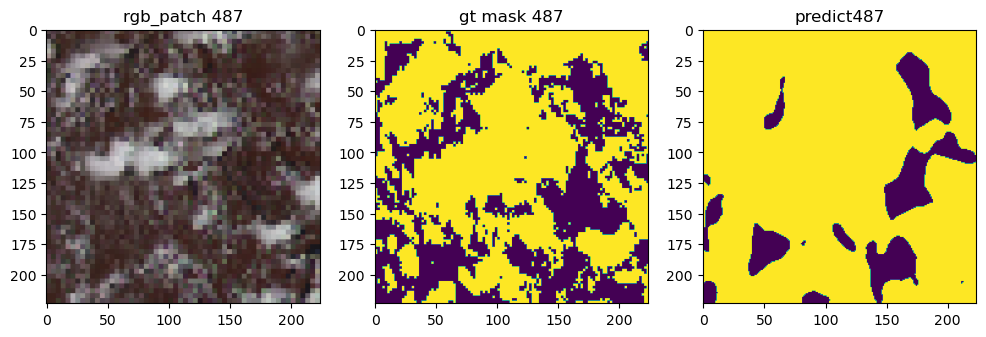

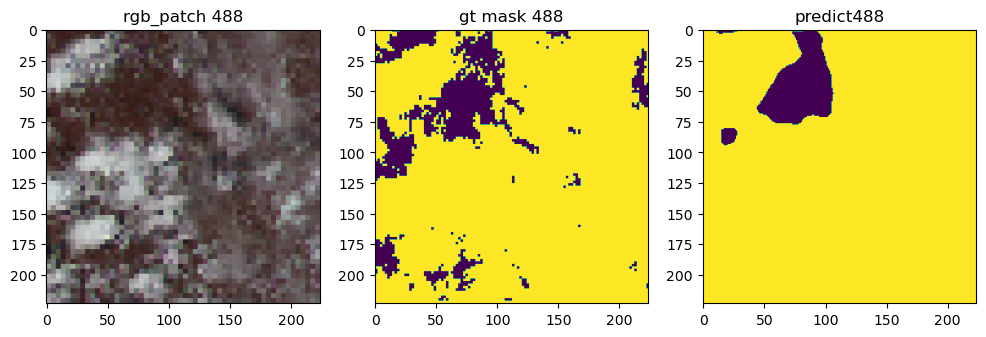

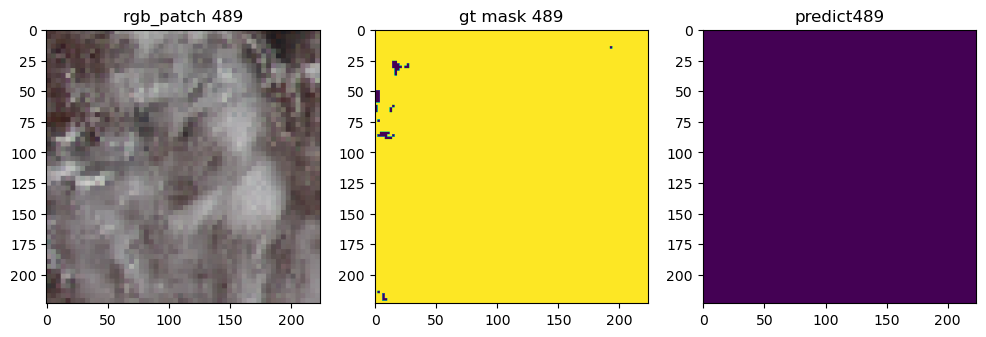

In [40]:
def visualize_levir_pred(idx, model, dataset):
    x_rgb_lonlat,gt = dataset[idx]
    x_rgb_lonlat,gt = x_rgb_lonlat.to(device),gt.to(device)
    fig, ax = plt.subplots(1,3, figsize=(12,4))
    cloud_mask = model(x_rgb_lonlat.unsqueeze(0))
    pred=predb_to_mask(cloud_mask).numpy()
    ax[0].imshow(open_sample_as_pil_no_norm(x_rgb_lonlat.cpu()))
    ax[1].imshow(open_mask_as_pil(gt.cpu()))
    ax[2].imshow(pred)
    ax[0].set_title('rgb_patch '+str(idx))
    ax[1].set_title('gt mask '+str(idx))
    ax[2].set_title('predict'+str(idx))
    plt.show()
def visualize_levir_pred_dl(model, dl, num_batches = 1):
    iterator = iter(dl)
    for j in range(num_batches):
        x,y = next(iterator)
        for i in range(len(x)):
            x_rgb_lonlat,gt = x[i], y[i]
            x_rgb_lonlat,gt = x_rgb_lonlat.to(device),gt.to(device)
            fig, ax = plt.subplots(1,3, figsize=(12,4))
            cloud_mask = model(x_rgb_lonlat.unsqueeze(0))
            pred=predb_to_mask(cloud_mask).numpy()
            ax[0].imshow(open_sample_as_pil_no_norm(x_rgb_lonlat.cpu()))
            ax[1].imshow(open_mask_as_pil(gt.cpu()))
            ax[2].imshow(pred)
            ax[0].set_title('rgb_patch '+str(i))
            ax[1].set_title('gt mask '+str(i))
            ax[2].set_title('predict'+str(i))
            plt.show()
model.eval()
for idx in range(450,490,1):
    visualize_levir_pred(idx, model = uniform_model,dataset = Electro_ds_full_test)